In [1]:
cd ..

m:\OneDrive\Projects\federated_imputation_pc2


## Loading

In [2]:
%load_ext autoreload
%autoreload
import copy
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import random
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from dython.nominal import correlation_ratio
import missingno as msno
from src.fed_imp.sub_modules.missing_simulate.missing_adder_new import simulate_nan_new
from src.modules.evaluation.imputation_quality import rmse, ws_cols, sliced_ws
from src.notebook_utils import (
    visualize_ms, correlation, run_pred, sklearn_evaluation, NN_evaluation,
    run_simulation, simulate_scenario
)

In [3]:
experiment_config_template = {
  "num_clients": 3,
  "data": {
    "dataset_name": "nhis_income_pca",
    "normalize": True,
  },
  "handle_imbalance": None,
  "data_partition": {
    "strategy": "sample@p=4000",
    "params": {}
  },
  "missing_simulate": {
    "mr_strategy": "fixed",
    "mf_strategy": "all",
    "mm_strategy": "mnar_lr"
  },
  "imputation": {
    "initial_strategy_num": "mean",
    "initial_strategy_cat": "mode",
    "estimator_num": "ridge_cv",
    "estimator_cat": "logistic_cv",
    "imp_evaluation_model": "logistic",
    "imp_evaluation_params": {
      "tune_params": "gridsearch"
    },
    "clip": True
  },
  "agg_strategy_imp": {
    "strategy": "fedavg-s",
    "params": {
      "ms_field": "missing_cell_pct",
      "beta": 0.7
    }
  },
  "server_type": "fedavg_pytorch",
  "server": {
    "impute_mode": "instant",
    "imp_round": 20,
    "imp_local_epochs": 0,
    "pred_round": 0,
    "pred_local_epochs": 0,
    "model_fit_mode": "one_shot"
  },
  "pred_model": {
    "model_params": {
      "model": "2nn",
      "num_hiddens": 64,
      "model_init_config": None,
      "model_other_params": None
    },
    "train_params": {
      "batch_size": 128,
      "learning_rate": 0.001,
      "weight_decay": 0.0000,
      "pred_round": 200,
      "pred_local_epochs": 3
    }
  },
  "experiment": {
    "n_rounds": 1,
    "seed": 102931466,
    "mtp": False,
    "random_seed": 50,
    "num_process": 3,
    "test_size": 0.1,
    "track": True
  },
  "tune_params": False,
  "track": False,
  "tune_params": True,
  "prediction": False,
  "save_state": False,
  "test_size": 0.1,
  "algo_params": {
    "local": {},
    "fedavg-s": {},
    "fedwavg": {
      "alpha": 0.9
    },
    "fedmechw": {
      "client_thres": 1.0,
      "alpha": 1.0,
      "beta": 0.0,
      "scale_factor": 4
    },
    "fedmechw_new": {
      "client_thres": 1.0,
      "alpha": 1.0,
      "gamma": 0.0,
      "scale_factor": 4
    },
    "fedmechw_new2": {
      "client_thres": 1.0,
      "alpha": 1.0,
      "gamma": 0.0,
      "scale_factor": 4,
      "mm_thres": 200
    },
    "fedmechclw": {
      "client_thres": 0.2,
      "thres1": 0.2,
      "alpha": 0.5
    },
    'testavg':{
        
    },
    'testavg2':{
        
    },
    'testavg3':{
        
    },
    "scale_factor": 4
  }
}

server_config_tmpl = {
    "server_name": 'fedavg_mlp_pytorch_pred',
    "server_pred_config": {
        "model_params": {
            "model": "2nn",
            "num_hiddens": 32,
            "model_init_config": None,
            "model_other_params": None
        },
        "train_params": {
            "batch_size": 300,
            "learning_rate": 0.001,
            "weight_decay": 0.0,
            "pred_round": 500,
            "pred_local_epochs": 3,
            'local_epoch': 5,
            'sample_pct': 1
        }
    },
    "server_config": {
        'pred_rounds': 1,
        'seed': 21
    }
}

In [4]:
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
def vis_mm_sim(mm_coefs, metric = 'cos'):
    n_cols = 5
    n_rows = (mm_coefs.shape[0] - 1) // n_cols + 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5))

    for feature_idx in range(mm_coefs.shape[0]):
        
        X = mm_coefs[feature_idx]
        # tsne = TSNE(n_components=2, verbose=0, perplexity=4, n_iter=500)
        # decomp_results = tsne.fit_transform(X)
        ax = axes[feature_idx // n_cols, feature_idx % n_cols]
        if metric == 'cos':
            cosine_sim = 1 - (cosine_similarity(X) + 1)/2
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax, vmin = 0, vmax =1)
        else:
            raise NotImplementedError
        ax.title.set_text("feature {}".format(feature_idx))
    
    fig.suptitle("Mechanism Similarity")
    plt.tight_layout()
    plt.show()

10 0.14185106490048777
50 0.2689414213699951
100 0.5
200 0.8807970779778823
500 0.9996646498695336
1000 0.9999999847700205


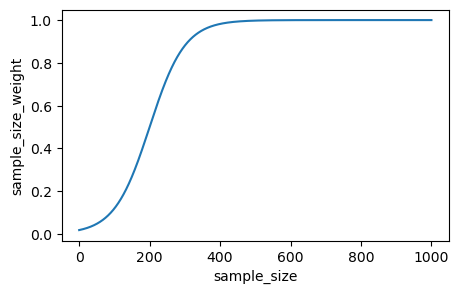

In [5]:
def sigmoid(x, thres, steep):
    return 1 / (1 + np.exp(-steep * (x - thres)))

for x in np.array([10, 50, 100, 200, 500, 1000]):
    print(x, sigmoid(x, 100, 0.02))
    
fig, ax = plt.subplots(1, 1, figsize=(5, 3))
x = np.arange(0, 1000, 0.1)
y = sigmoid(x, 200, 0.02)
ax.plot(x, y)
ax.set_xlabel("sample_size")
ax.set_ylabel("sample_size_weight")
plt.show()

# CodRNA

In [7]:
trackers = {}
rets ={}
mr_strategy = 'fixed@mr=0.5'

## Clients MNAR LR

### Simple Avg

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-23 11:05:17.499 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:05:17.500 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 11:05:50.668 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:05:50.669 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 11:06:22.704 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:06:22.705 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 11:06:25.941 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 70.93176599999424


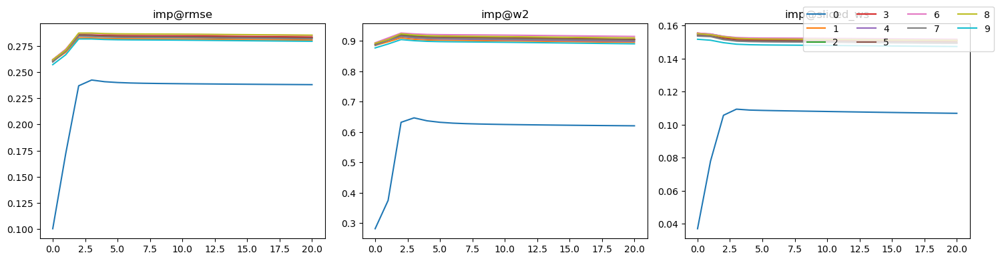

{'imp@rmse': 0.27822271001114046, 'imp@ws': 0.8747674771979429, 'imp@sliced_ws': 0.14578667183696412}


2023-10-23 11:06:30.397 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6700, test_f1: 0.0000 test_auroc: 0.7887 test_auprc: 0.6553 train_loss: 0.6613 val_accu: 0.6694 val_f1: 0.4010
2023-10-23 11:06:40.326 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.7645, test_f1: 0.5149 test_auroc: 0.7861 test_auprc: 0.6899 train_loss: 0.5084 val_accu: 0.7694 val_f1: 0.7049
2023-10-23 11:06:50.306 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.7375, test_f1: 0.4312 test_auroc: 0.6924 test_auprc: 0.5976 train_loss: 0.4788 val_accu: 0.7858 val_f1: 0.7128
2023-10-23 11:07:00.360 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.7500, test_f1: 0.4505 test_auroc: 0.5958 test_auprc: 0.5414 train_loss: 0.4655 val_accu: 0.7950 val_f1: 0.7338
2023-1

0.7805 0.5800711743772242 0.8651368159203982 0.7495456107598423


In [8]:
name = 'mnar_lr_codrna_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

### Complementary Purely

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-23 11:07:32.764 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:07:32.765 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 11:08:02.512 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:08:02.514 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 11:08:35.635 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:08:35.635 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 11:08:38.980 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 68.6493974000332


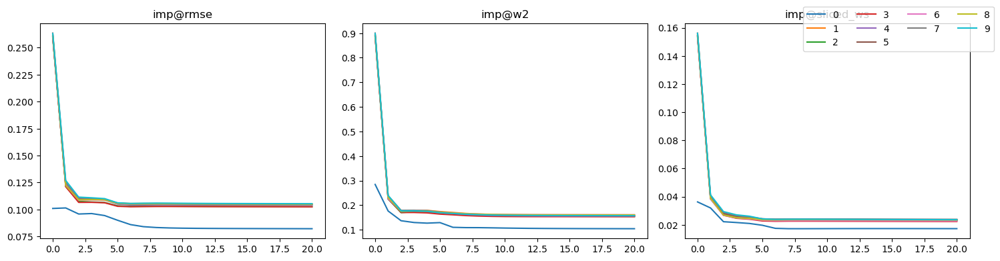

2023-10-23 11:08:39.425 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6685, test_f1: 0.0000 test_auroc: 0.6875 test_auprc: 0.5348 train_loss: 0.6596 val_accu: 0.6694 val_f1: 0.4010


{'imp@rmse': 0.10204213462868265, 'imp@ws': 0.15209221330009157, 'imp@sliced_ws': 0.022669332012629793}


2023-10-23 11:08:49.364 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.9310, test_f1: 0.9011 test_auroc: 0.9811 test_auprc: 0.9546 train_loss: 0.3473 val_accu: 0.8403 val_f1: 0.8148
2023-10-23 11:08:59.251 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.9370, test_f1: 0.9065 test_auroc: 0.9819 test_auprc: 0.9591 train_loss: 0.3400 val_accu: 0.8503 val_f1: 0.8188
2023-10-23 11:09:09.208 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.9330, test_f1: 0.9030 test_auroc: 0.9802 test_auprc: 0.9585 train_loss: 0.3293 val_accu: 0.8572 val_f1: 0.8329
2023-10-23 11:09:19.392 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 400, test_accu: 0.9275, test_f1: 0.8956 test_auroc: 0.9788 test_auprc: 0.9569 train_loss: 0.3209 val_accu: 0.8597 val_f1: 0.8366


0.9395 0.910436713545522 0.9827770012555969 0.9615346191111134


In [9]:
name = 'mnar_lr_codrna_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

### Complementary split

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-23 11:13:13.791 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:13:13.792 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 11:13:43.278 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:13:43.279 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 11:14:15.961 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:14:15.961 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 11:14:48.514 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:14:48.515 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

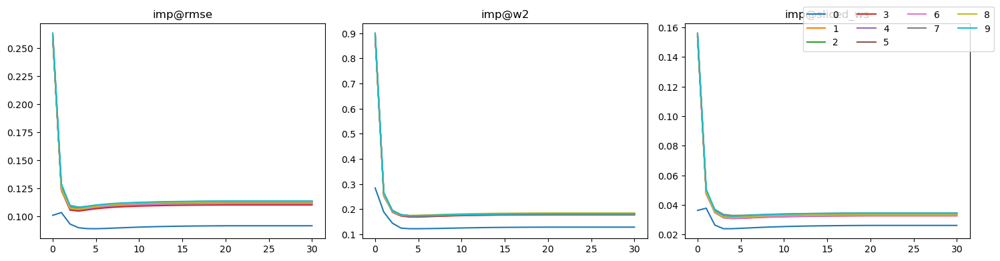

2023-10-23 11:14:52.201 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6685, test_f1: 0.0000 test_auroc: 0.7020 test_auprc: 0.5441 train_loss: 0.6596 val_accu: 0.6694 val_f1: 0.4010


{'imp@rmse': 0.11028150345918354, 'imp@ws': 0.17551164292157811, 'imp@sliced_ws': 0.03302771919151228}


2023-10-23 11:15:02.162 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.9245, test_f1: 0.8900 test_auroc: 0.9725 test_auprc: 0.9388 train_loss: 0.3463 val_accu: 0.8433 val_f1: 0.8167
2023-10-23 11:15:11.872 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.9265, test_f1: 0.8915 test_auroc: 0.9737 test_auprc: 0.9442 train_loss: 0.3388 val_accu: 0.8508 val_f1: 0.8199
2023-10-23 11:15:21.478 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.9230, test_f1: 0.8884 test_auroc: 0.9733 test_auprc: 0.9456 train_loss: 0.3284 val_accu: 0.8567 val_f1: 0.8313
2023-10-23 11:15:31.196 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 400, test_accu: 0.9210, test_f1: 0.8855 test_auroc: 0.9718 test_auprc: 0.9443 train_loss: 0.3195 val_accu: 0.8539 val_f1: 0.8296


0.936 0.9060205580029369 0.9764809669336925 0.9516235138874582


In [11]:
name = 'mnar_lr_codrna_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 1.0,
    "gamma": 0.1,
    "client_thres": 1.0,
    "scale_factor": 4,
    'mm_thres': 0.05
}

config2['server']['imp_round'] = 30

config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

#### Split gamma tune

In [12]:
%matplotlib inline
results_gamma = []
for gamma in [0.0, 0.1, 0.3, 0.5, 0.75, 1.0]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 10
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
    config2['data_partition']['strategy'] = 'sample-evenly'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": 1.0,
        "gamma": gamma,
        "client_thres": 1.0,
        "scale_factor": 4,
        'mm_thres': 0.1
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = False)
    results_gamma.append(ret.copy())

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 11:18:58.494 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:18:58.495 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 11:19:28.792 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:19:28.793 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 11:20:01.946 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:20:01.946 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 11:20:35.332 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:20:35.333 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

{'imp@rmse': 0.10181048808297614, 'imp@ws': 0.151520692532257, 'imp@sliced_ws': 0.022513993042115578}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 11:20:51.204 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:20:51.205 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 11:21:20.872 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:21:20.872 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 11:21:54.079 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:21:54.080 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 11:22:26.897 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:22:26.898 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

{'imp@rmse': 0.09335472903524099, 'imp@ws': 0.13415922524520718, 'imp@sliced_ws': 0.023966406518022905}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 11:22:42.828 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:22:42.829 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 11:23:12.126 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:23:12.127 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 11:23:44.774 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:23:44.775 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 11:24:17.485 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:24:17.486 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

{'imp@rmse': 0.13752185423000277, 'imp@ws': 0.27723663606579174, 'imp@sliced_ws': 0.059971848523050646}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 11:24:33.416 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:24:33.416 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 11:25:02.636 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:25:02.636 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 11:25:35.146 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:25:35.146 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 11:26:07.546 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:26:07.547 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

{'imp@rmse': 0.15734365158919542, 'imp@ws': 0.3633402425283742, 'imp@sliced_ws': 0.07702455250626392}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 11:26:23.438 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:26:23.439 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 11:26:52.413 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:26:52.414 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 11:27:24.709 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:27:24.710 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 11:27:56.970 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:27:56.970 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

{'imp@rmse': 0.17930312623306283, 'imp@ws': 0.46676851089217103, 'imp@sliced_ws': 0.09290856087205202}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 11:28:12.829 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:28:12.829 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 11:28:41.254 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:28:41.255 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 11:29:13.067 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:29:13.068 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 11:29:44.712 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:29:44.713 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

{'imp@rmse': 0.289634853633151, 'imp@ws': 0.9434533517151392, 'imp@sliced_ws': 0.15196475795661468}


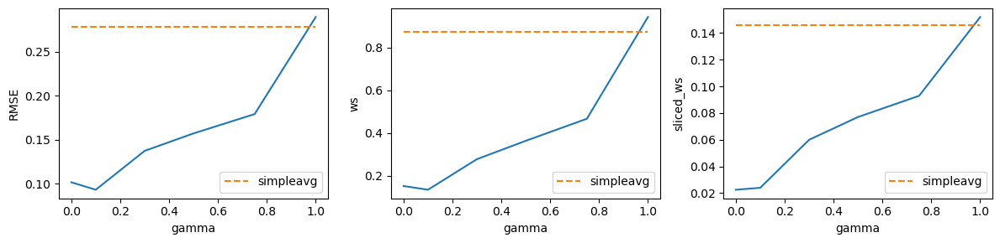

In [25]:
x = [0.0, 0.1, 0.3, 0.5, 0.75, 1.0]
y_rmse = [r['imp_result']['imp@rmse'] for r in results_gamma]
y_ws = [r['imp_result']['imp@ws'] for r in results_gamma]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results_gamma]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('gamma')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.27822271001114046
ws = 0.8747674771979429
sliced_ws = 0.14578667183696412
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()



#### split tune mm_thres

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 13:44:06.794 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:44:06.794 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 13:44:40.851 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:44:40.852 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 13:45:13.141 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:45:13.142 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 13:45:47.664 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:45:47.664 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

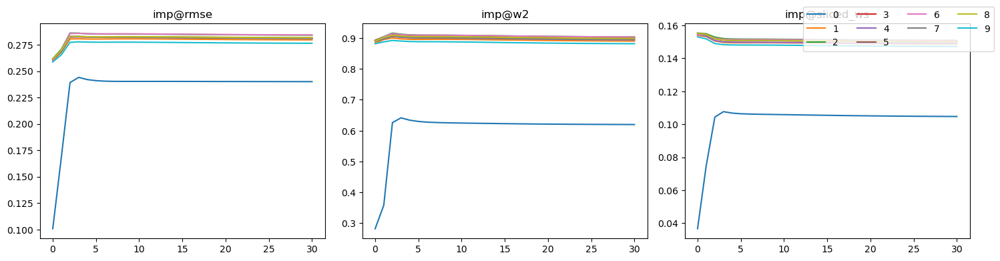

{'imp@rmse': 0.27713041632993135, 'imp@ws': 0.8684786159328058, 'imp@sliced_ws': 0.14510666631558106}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 13:46:06.726 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:46:06.726 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 13:46:38.239 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:46:38.240 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 13:47:12.735 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:47:12.736 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 13:47:47.537 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:47:47.538 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

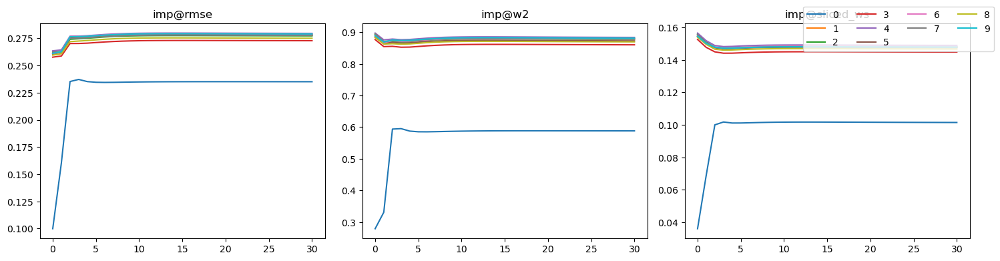

{'imp@rmse': 0.27320645882074024, 'imp@ws': 0.8470375889420972, 'imp@sliced_ws': 0.14289385304266317}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 13:48:06.694 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:48:06.695 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 13:48:39.116 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:48:39.117 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 13:49:14.873 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:49:14.874 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 13:49:51.040 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:49:51.040 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

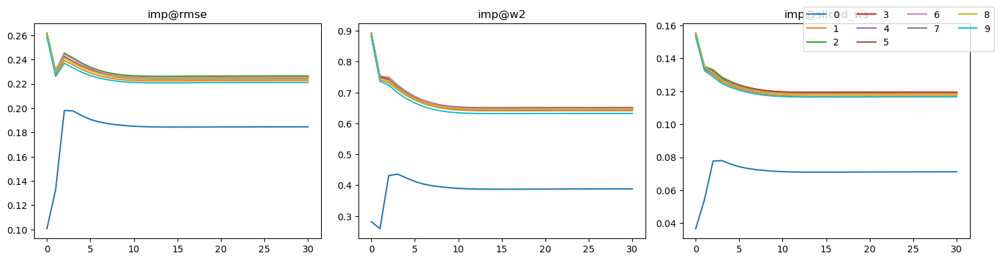

{'imp@rmse': 0.22047896565235298, 'imp@ws': 0.6195479574687783, 'imp@sliced_ws': 0.11366266477554907}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 13:50:09.744 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:50:09.744 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 13:50:42.691 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:50:42.692 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 13:51:17.622 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:51:17.622 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 13:51:50.530 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:51:50.531 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

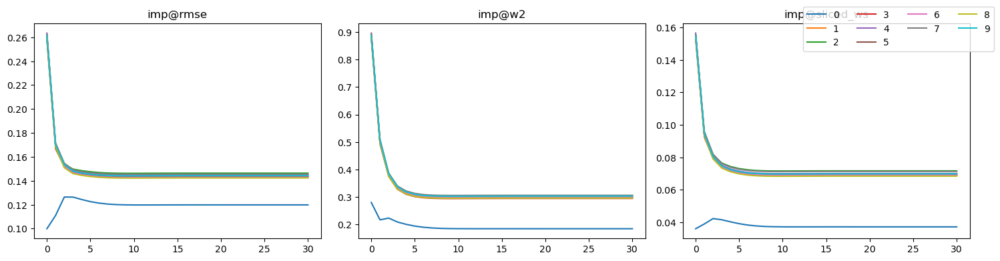

{'imp@rmse': 0.14165634278709577, 'imp@ws': 0.28816536874622034, 'imp@sliced_ws': 0.06654793769923546}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 13:52:07.041 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:52:07.042 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 13:52:36.718 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:52:36.719 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 13:53:10.081 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:53:10.082 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 13:53:43.649 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:53:43.649 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

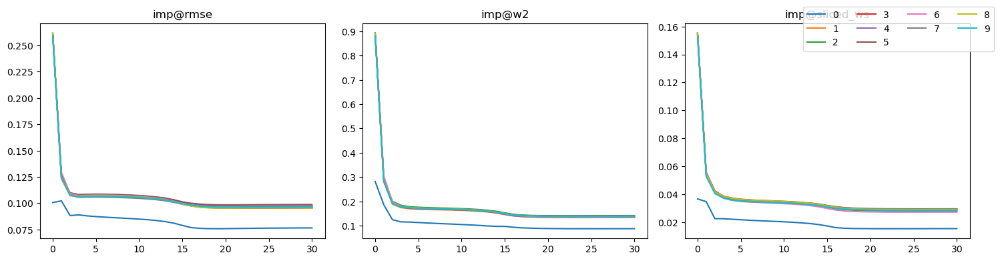

{'imp@rmse': 0.0945024013229102, 'imp@ws': 0.13290748641082953, 'imp@sliced_ws': 0.027325423337201667}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 13:53:59.989 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:53:59.990 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 13:54:29.910 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:54:29.911 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 13:55:03.242 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:55:03.242 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 13:55:36.143 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:55:36.143 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

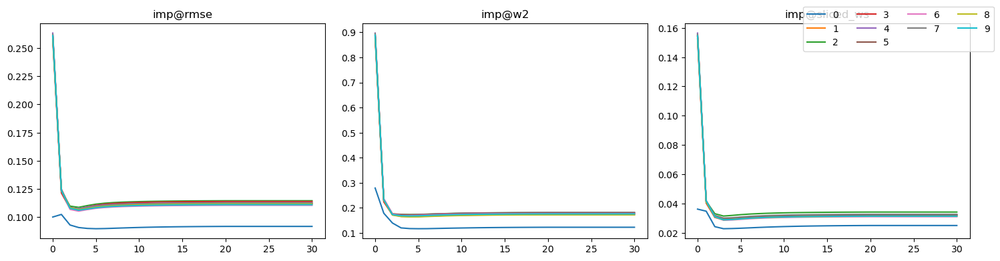

{'imp@rmse': 0.1101158467170725, 'imp@ws': 0.17120595132166128, 'imp@sliced_ws': 0.03131131013284991}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 13:55:52.822 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:55:52.823 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 13:56:22.412 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:56:22.412 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 13:56:55.928 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:56:55.928 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 13:57:29.172 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 13:57:29.173 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

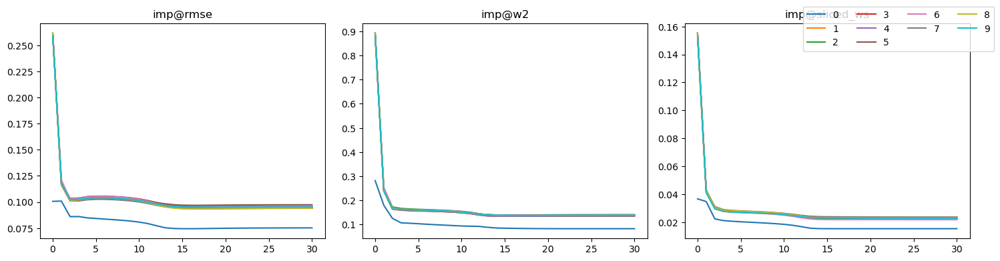

{'imp@rmse': 0.09308890314717941, 'imp@ws': 0.1324015903846414, 'imp@sliced_ws': 0.022037587664549087}


In [27]:
%matplotlib inline
results_mmthres = []
for mm_thres in [0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 10
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
    config2['data_partition']['strategy'] = 'sample-evenly'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": mm_thres,
        "gamma": 0.05,
        "client_thres": 1.0,
        "scale_factor": 4
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = True)
    results_mmthres.append(ret.copy())

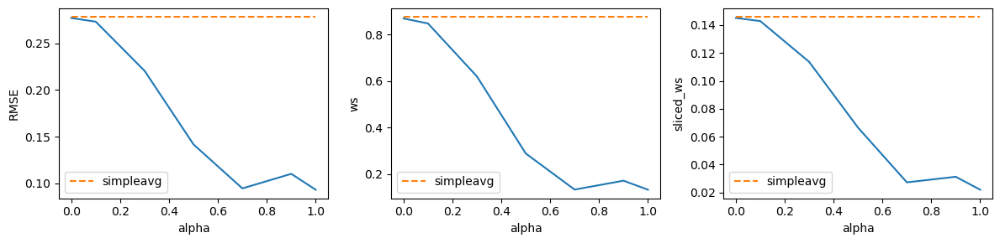

In [28]:
x = [0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0]
y_rmse = [r['imp_result']['imp@rmse'] for r in results_mmthres]
y_ws = [r['imp_result']['imp@ws'] for r in results_mmthres]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results_mmthres]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('alpha')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.27822271001114046
ws = 0.8747674771979429
sliced_ws = 0.14578667183696412
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()

plt.tight_layout()
plt.show()


#### Split tune scale

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 11:59:45.261 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 11:59:45.261 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 12:00:19.438 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:00:19.438 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 12:00:52.742 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:00:52.743 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 12:01:25.815 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:01:25.816 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

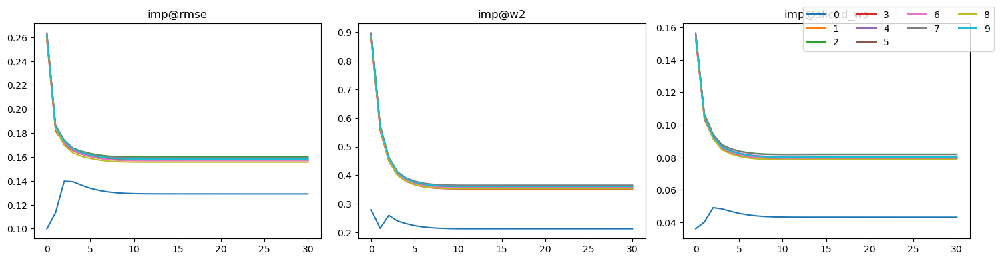

{'imp@rmse': 0.15500891376869563, 'imp@ws': 0.34417097864458207, 'imp@sliced_ws': 0.07654952355643688}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 12:01:42.509 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:01:42.510 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 12:02:12.505 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:02:12.506 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 12:02:45.965 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:02:45.966 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 12:03:19.317 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:03:19.318 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

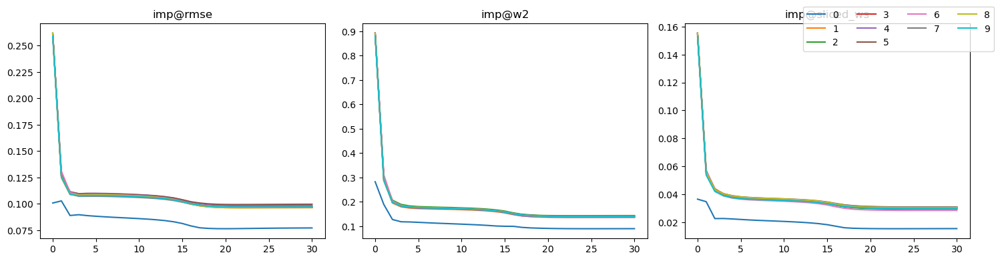

{'imp@rmse': 0.09514216469880071, 'imp@ws': 0.13430436648340718, 'imp@sliced_ws': 0.02872524008156887}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 12:03:35.636 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:03:35.637 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 12:04:05.635 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:04:05.635 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 12:04:38.820 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:04:38.821 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 12:05:11.769 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:05:11.770 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

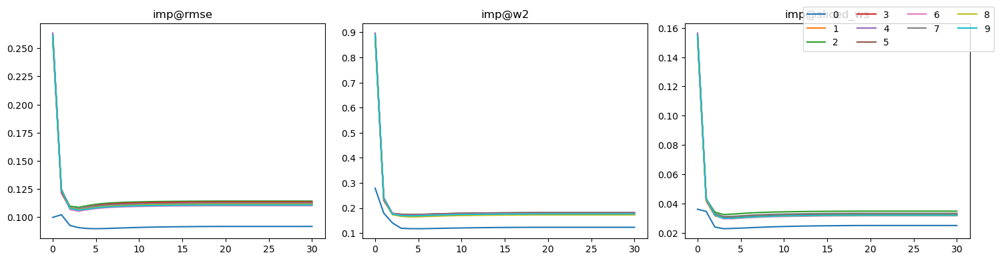

{'imp@rmse': 0.11012112537113895, 'imp@ws': 0.17165234233092652, 'imp@sliced_ws': 0.031944491900937136}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
10
[1, 9]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 12:05:28.144 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:05:28.145 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 12:05:58.396 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:05:58.396 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 12:06:31.907 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:06:31.908 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 12:07:05.325 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 12:07:05.325 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

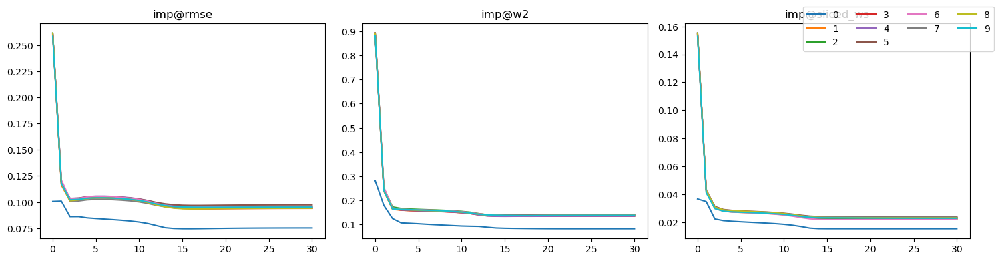

{'imp@rmse': 0.09309045265223205, 'imp@ws': 0.13234159443392743, 'imp@sliced_ws': 0.022096795315983978}


In [22]:
%matplotlib inline
results_scale = []
for scale in [1, 2, 3, 4]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 10
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
    config2['data_partition']['strategy'] = 'sample-evenly'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": 0.9,
        "gamma": 0.05,
        "client_thres": 1.0,
        "scale_factor": scale
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = True)
    results_scale.append(ret.copy())

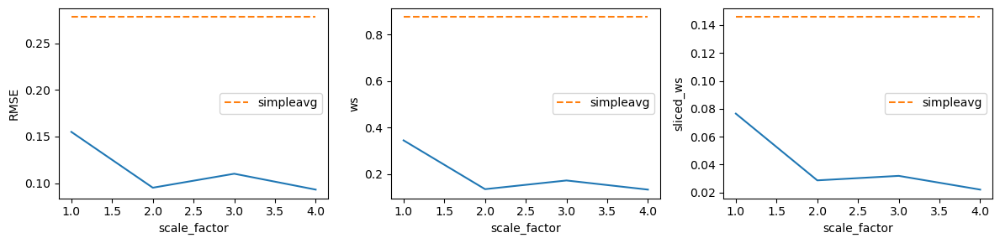

In [24]:
x = [1, 2, 3, 4]
y_rmse = [r['imp_result']['imp@rmse'] for r in results_scale]
y_ws = [r['imp_result']['imp@ws'] for r in results_scale]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results_scale]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('scale_factor')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.27822271001114046
ws = 0.8747674771979429
sliced_ws = 0.14578667183696412
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()

plt.tight_layout()
plt.show()


## Clients MNAR 10 clients no complementary

### Simple average

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-23 14:19:34.039 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:19:34.040 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 14:20:02.169 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:20:02.169 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 14:20:33.622 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:20:33.622 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 14:21:04.846 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:21:04.847 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

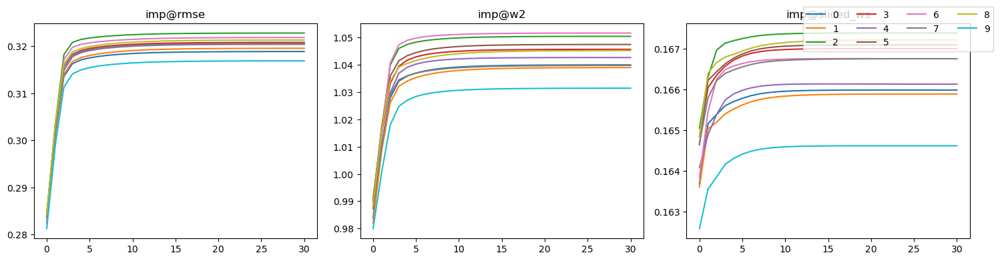

2023-10-23 14:21:08.397 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6615, test_f1: 0.0000 test_auroc: 0.8121 test_auprc: 0.6550 train_loss: 0.6635 val_accu: 0.6611 val_f1: 0.3980


{'imp@rmse': 0.3203709029265051, 'imp@ws': 1.0432949251070116, 'imp@sliced_ws': 0.16648186204515494}


2023-10-23 14:21:18.696 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.5630, test_f1: 0.4005 test_auroc: 0.4609 test_auprc: 0.4544 train_loss: 0.5068 val_accu: 0.7678 val_f1: 0.6861
2023-10-23 14:21:28.816 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.2810, test_f1: 0.4107 test_auroc: 0.3819 test_auprc: 0.3018 train_loss: 0.4625 val_accu: 0.7883 val_f1: 0.7234
2023-10-23 14:21:39.532 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.3020, test_f1: 0.4344 test_auroc: 0.4073 test_auprc: 0.3074 train_loss: 0.4490 val_accu: 0.7917 val_f1: 0.7344
2023-10-23 14:21:50.175 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 400, test_accu: 0.3100, test_f1: 0.4404 test_auroc: 0.4237 test_auprc: 0.3118 train_loss: 0.4417 val_accu: 0.7981 val_f1: 0.7434


0.715 0.46005620232838224 0.8121196287476093 0.6550314694057194


In [33]:
name = 'mnar_lr_codrna_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.0'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

### Complementary

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-12 12:50:58.710 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:50:58.711 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:51:27.699 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:51:27.700 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:51:59.828 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:51:59.829 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:52:03.095 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.90603429998737


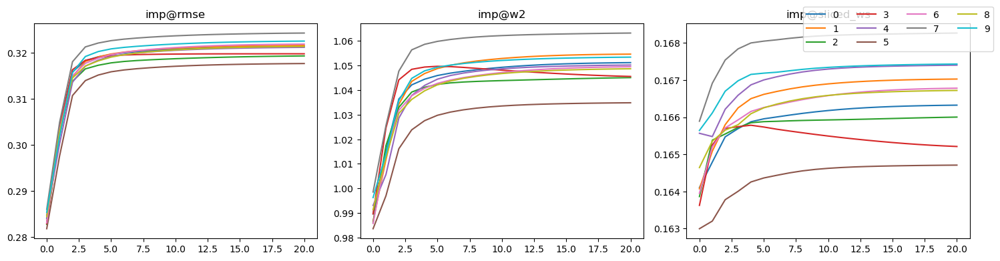

2023-10-12 12:52:03.526 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6685, test_f1: 0.0000 test_auroc: 0.7770 test_auprc: 0.6000 train_loss: 0.6626 val_accu: 0.6694 val_f1: 0.4010


{'imp@rmse': 0.32108221061148867, 'imp@ws': 1.0495496076525759, 'imp@sliced_ws': 0.16658073680649604}


2023-10-12 12:52:13.912 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.4350, test_f1: 0.3430 test_auroc: 0.3934 test_auprc: 0.3176 train_loss: 0.5014 val_accu: 0.7739 val_f1: 0.6868
2023-10-12 12:52:24.251 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.2620, test_f1: 0.3740 test_auroc: 0.3831 test_auprc: 0.2975 train_loss: 0.4710 val_accu: 0.7881 val_f1: 0.7204
2023-10-12 12:52:34.763 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.2800, test_f1: 0.3872 test_auroc: 0.3962 test_auprc: 0.3014 train_loss: 0.4625 val_accu: 0.7942 val_f1: 0.7269
2023-10-12 12:52:45.220 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 400, test_accu: 0.3105, test_f1: 0.3949 test_auroc: 0.4220 test_auprc: 0.3087 train_loss: 0.4685 val_accu: 0.7925 val_f1: 0.7207


0.704 0.4253666954270923 0.8219438399604707 0.6709654928817823


In [41]:
name = 'mnar_lr_codrna_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.0'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

### Complementary Split

#### Tune Gamma

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:53:09.138 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:53:09.139 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:53:37.981 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:53:37.982 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:54:10.269 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:54:10.270 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:54:13.481 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.81537710000703


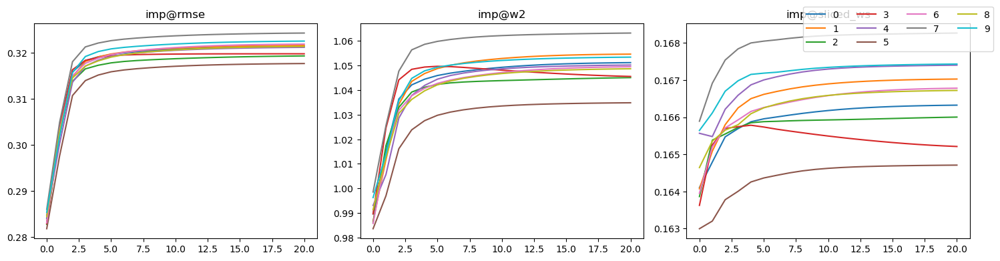

{'imp@rmse': 0.321082210611491, 'imp@ws': 1.0495496076525885, 'imp@sliced_ws': 0.1665807368064966}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:54:26.763 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:54:26.763 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:54:55.515 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:54:55.515 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:55:27.445 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:55:27.446 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:55:30.676 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.429200700004


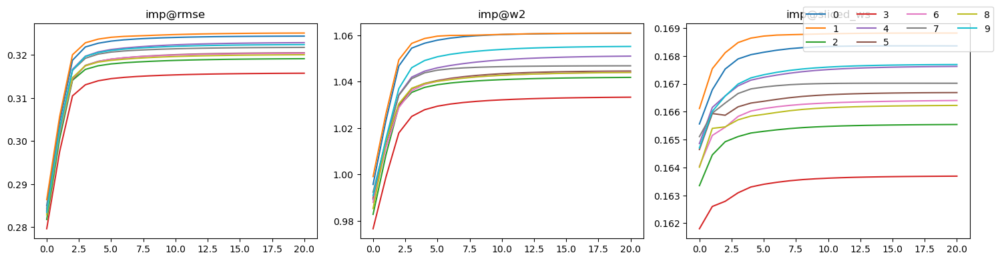

{'imp@rmse': 0.32121327593625554, 'imp@ws': 1.0481968571923064, 'imp@sliced_ws': 0.166800016671648}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:55:43.961 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:55:43.962 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:56:12.968 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:56:12.969 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:56:45.075 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:56:45.076 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:56:48.293 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.83628930000123


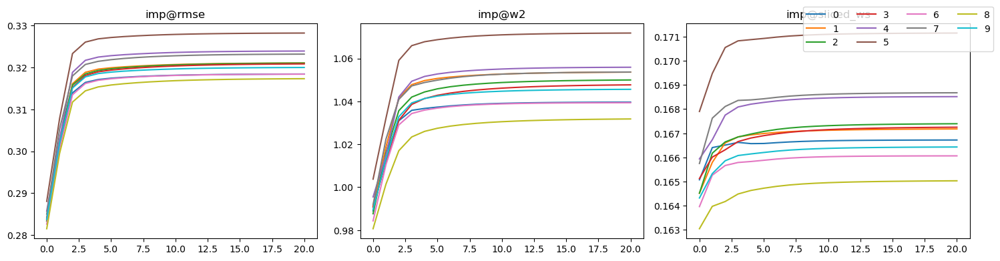

{'imp@rmse': 0.321226932885492, 'imp@ws': 1.0488273044963796, 'imp@sliced_ws': 0.16743384614497456}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:57:01.665 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:57:01.666 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:57:30.495 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:57:30.496 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:58:02.559 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:58:02.559 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:58:05.810 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.64957779999531


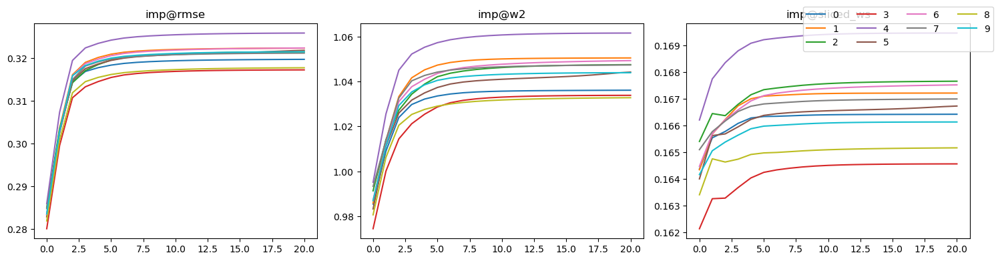

{'imp@rmse': 0.32106142026887796, 'imp@ws': 1.0445303278931817, 'imp@sliced_ws': 0.16678046354362303}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:58:19.163 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:58:19.163 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:58:47.934 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:58:47.934 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:59:19.984 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:59:19.984 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:59:23.218 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.5573124000075


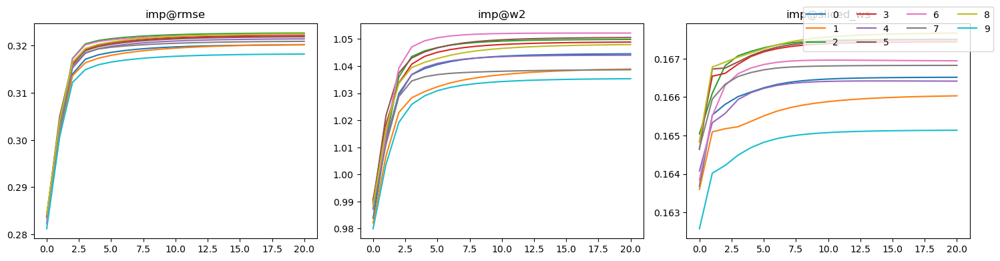

{'imp@rmse': 0.3211860042214183, 'imp@ws': 1.04499361656501, 'imp@sliced_ws': 0.1667931966774869}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:59:36.608 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:59:36.609 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:00:05.341 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:00:05.342 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:00:37.542 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:00:37.542 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:00:40.749 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.63509229999909


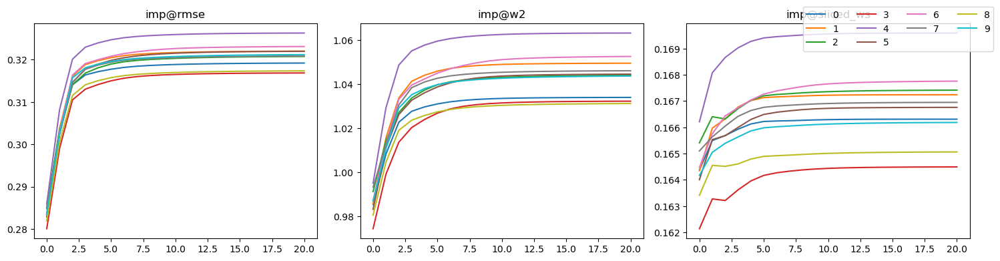

{'imp@rmse': 0.3209064041664353, 'imp@ws': 1.044060863754534, 'imp@sliced_ws': 0.166770528306128}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 13:00:54.008 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:00:54.008 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:01:22.820 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:01:22.821 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:01:54.925 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:01:54.926 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:01:58.163 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.64729680000164


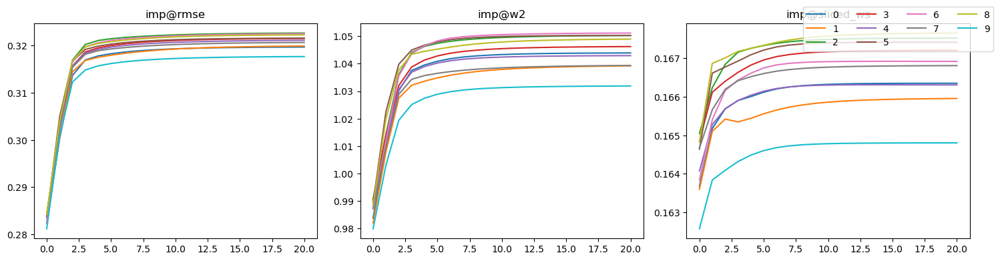

{'imp@rmse': 0.32094541386037995, 'imp@ws': 1.0443444225968697, 'imp@sliced_ws': 0.1666934258204128}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 13:02:11.572 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:02:11.572 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:02:40.518 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:02:40.519 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:03:12.538 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:03:12.538 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:03:15.795 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.71739429999434


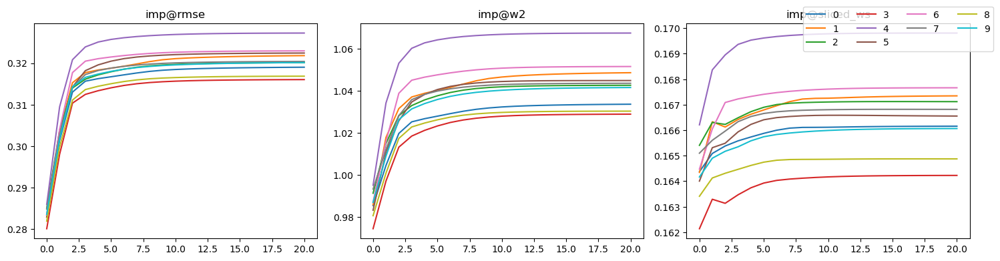

{'imp@rmse': 0.320659628421713, 'imp@ws': 1.0432540159208272, 'imp@sliced_ws': 0.16666158391890368}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 13:03:29.211 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:03:29.211 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:03:58.118 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:03:58.119 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:04:30.306 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:04:30.307 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:04:33.558 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.85249320000003


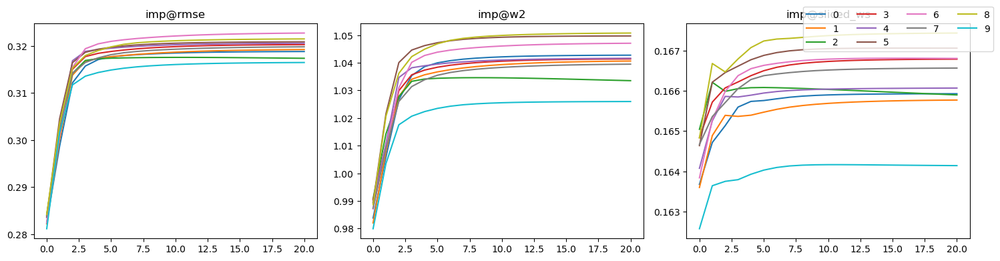

{'imp@rmse': 0.3197210141700432, 'imp@ws': 1.0412578642747092, 'imp@sliced_ws': 0.16624946130024157}


In [42]:
%matplotlib inline
results = []
for gamma in [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9, 1.0]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 10
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.0'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": 1.0,
        "gamma": gamma,
        "client_thres": 1.0,
        "scale_factor": 4
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = True)
    results.append(ret.copy())

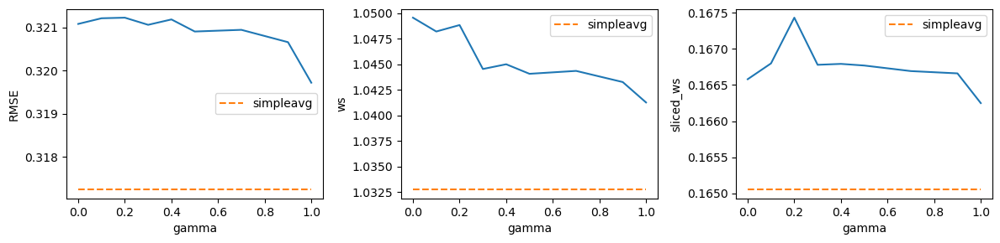

In [43]:
x = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9, 1.0]
y_rmse = [r['imp_result']['imp@rmse'] for r in results]
y_ws = [r['imp_result']['imp@ws'] for r in results]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('gamma')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.31724148632788224
ws = 1.0327202461435718
sliced_ws = 0.1650482253637849
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()

#### Tune alpha

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 13:04:47.107 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:04:47.108 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:05:15.972 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:05:15.972 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:05:47.965 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:05:47.965 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:05:51.196 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.57844409999961


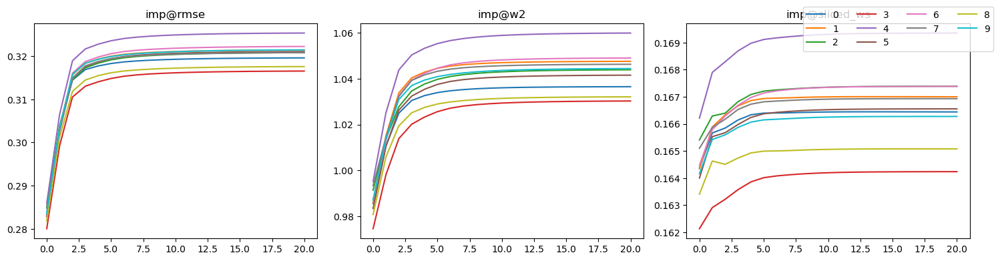

{'imp@rmse': 0.32061416460165526, 'imp@ws': 1.0431099721684856, 'imp@sliced_ws': 0.16666102926989015}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 13:06:04.542 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:06:04.542 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:06:33.355 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:06:33.355 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:07:05.374 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:07:05.375 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:07:08.562 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.50586540000222


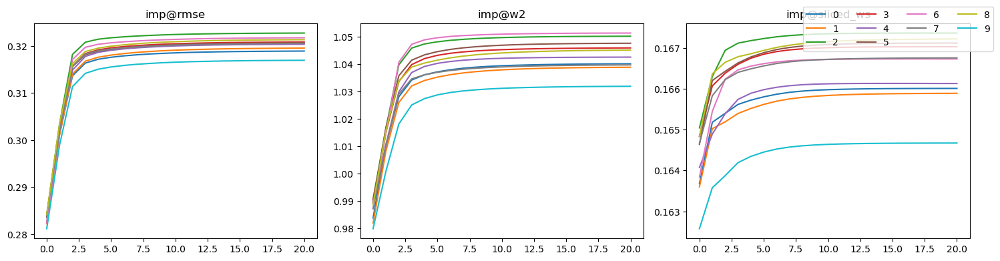

{'imp@rmse': 0.3203258852749493, 'imp@ws': 1.043266476264173, 'imp@sliced_ws': 0.16649240287569012}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 13:07:21.858 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:07:21.859 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:07:50.584 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:07:50.585 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:08:22.408 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:08:22.409 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:08:25.602 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.234655200009


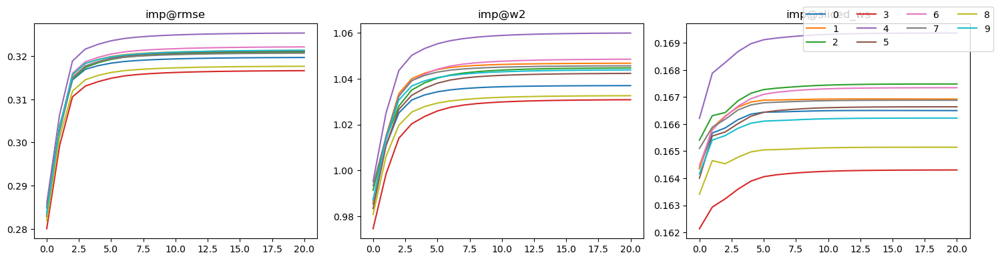

{'imp@rmse': 0.3206196274558809, 'imp@ws': 1.043168127682953, 'imp@sliced_ws': 0.16667780393292442}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 13:08:39.141 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:08:39.142 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:09:07.888 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:09:07.888 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:09:39.881 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:09:39.881 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:09:43.104 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.4499441999942


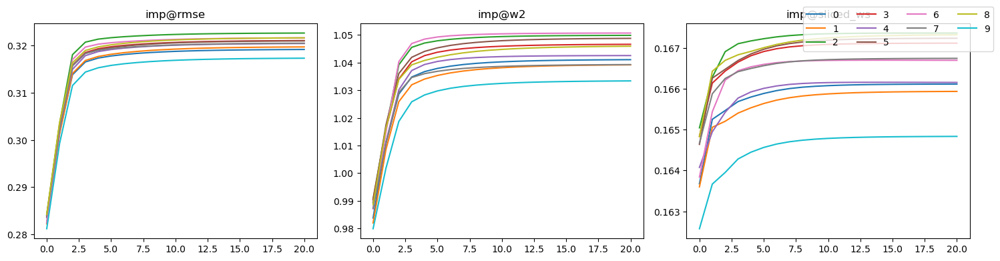

{'imp@rmse': 0.32044766055244106, 'imp@ws': 1.0436560177142324, 'imp@sliced_ws': 0.16655311687337648}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 13:09:56.366 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:09:56.367 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:10:25.188 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:10:25.189 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:10:57.179 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:10:57.180 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:11:00.406 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.5113868000044


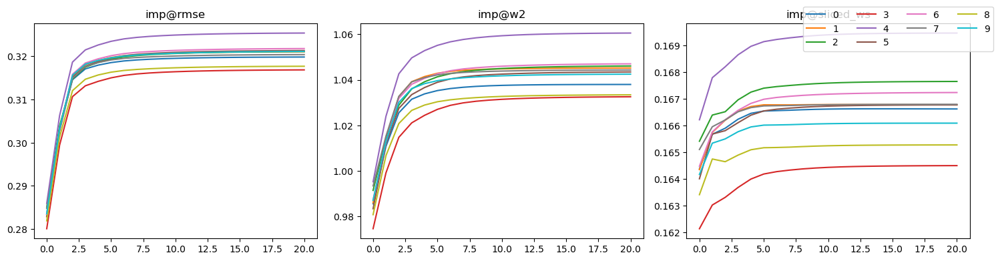

{'imp@rmse': 0.3206324620842138, 'imp@ws': 1.0432336599215402, 'imp@sliced_ws': 0.1667084549568766}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 13:11:13.728 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:11:13.728 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 13:11:42.605 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:11:42.606 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 13:12:14.630 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 13:12:14.631 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 13:12:17.839 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.59242469999299


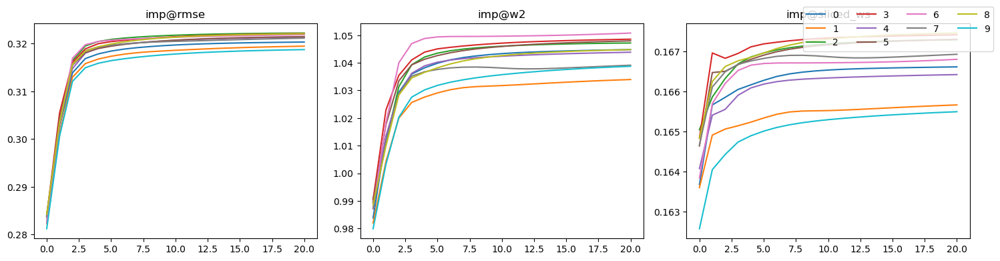

{'imp@rmse': 0.32099619830077236, 'imp@ws': 1.0436679311748367, 'imp@sliced_ws': 0.16672062770816395}


In [44]:
%matplotlib inline
results_alpha2 = []
for alpha in [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 10
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.0'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": alpha,
        "gamma": 0.05,
        "client_thres": 1.0,
        "scale_factor": 4
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = True)
    results_alpha2.append(ret.copy())

In [31]:
x = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
y_rmse = [r['imp_result']['imp@rmse'] for r in results_alpha2]
y_ws = [r['imp_result']['imp@ws'] for r in results_alpha2]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results_alpha2]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('alpha')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.31724148632788224
ws = 1.0327202461435718
sliced_ws = 0.1650482253637849
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()

NameError: name 'results_alpha2' is not defined

#### Tune Scale

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 14:11:10.385 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:11:10.385 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 14:11:42.702 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:11:42.702 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 14:12:14.341 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:12:14.342 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 14:12:46.061 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:12:46.062 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

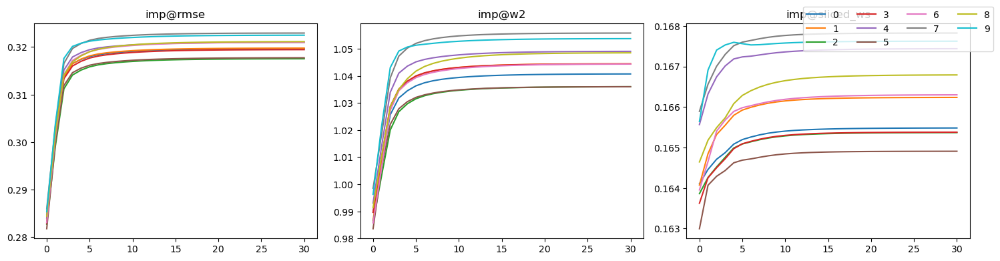

{'imp@rmse': 0.32025780557953937, 'imp@ws': 1.0453028734616316, 'imp@sliced_ws': 0.1663331950448753}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 14:13:02.347 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:13:02.347 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 14:13:31.586 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:13:31.587 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 14:14:03.845 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:14:03.846 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 14:14:36.201 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:14:36.202 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

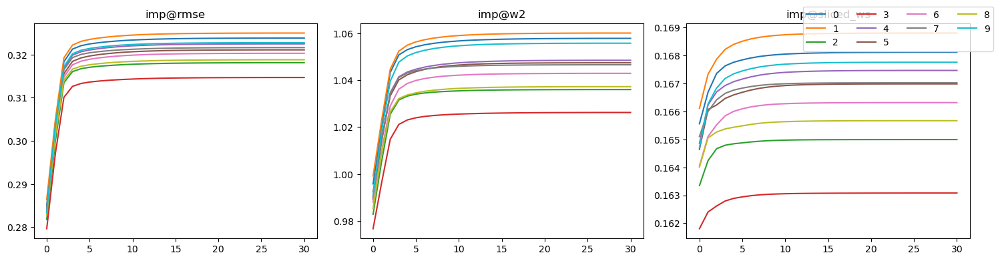

{'imp@rmse': 0.32085068179371534, 'imp@ws': 1.0457987277260803, 'imp@sliced_ws': 0.1666230496320402}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 14:14:52.151 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:14:52.152 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 14:15:20.484 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:15:20.484 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 14:15:52.112 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:15:52.112 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 14:16:23.282 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:16:23.283 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

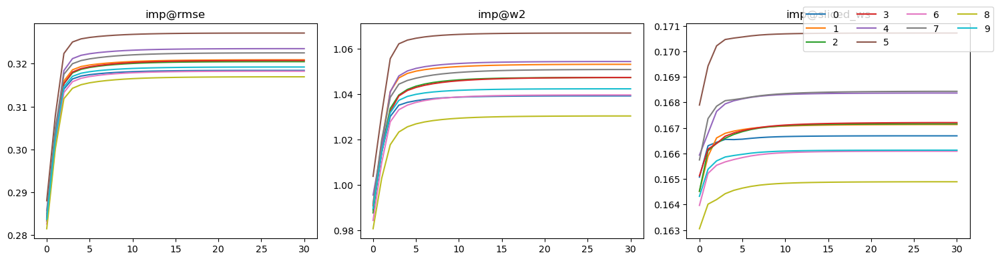

{'imp@rmse': 0.3208203127588983, 'imp@ws': 1.0471399164845878, 'imp@sliced_ws': 0.1672833867937826}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-23 14:16:39.365 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:16:39.367 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-23 14:17:07.615 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:17:07.615 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-23 14:17:39.049 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:17:39.050 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-23 14:18:10.773 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-23 14:18:10.774 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 

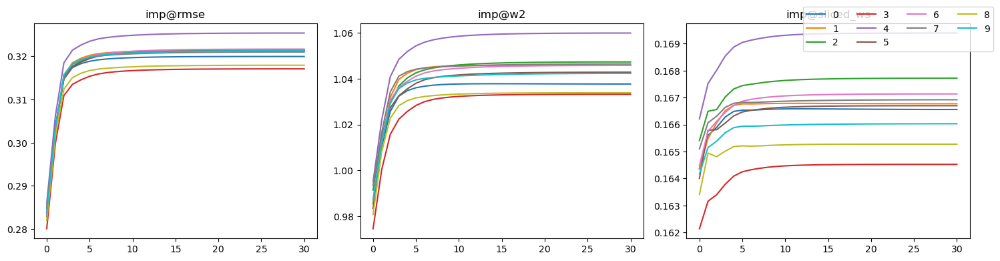

{'imp@rmse': 0.3208205923332532, 'imp@ws': 1.0435342161964871, 'imp@sliced_ws': 0.16670120228304536}


In [30]:
%matplotlib inline
results_scale2 = []
for scale in [1,2,3,4]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 10
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.0'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": 0.95,
        "gamma": 0.05,
        "client_thres": 1.0,
        "scale_factor": scale
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = True)
    results_scale2.append(ret.copy())

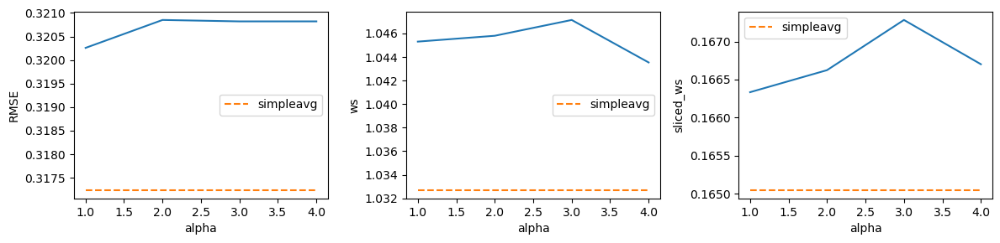

In [32]:
x = [1, 2, 3, 4]
y_rmse = [r['imp_result']['imp@rmse'] for r in results_scale2]
y_ws = [r['imp_result']['imp@ws'] for r in results_scale2]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results_scale2]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('alpha')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.31724148632788224
ws = 1.0327202461435718
sliced_ws = 0.1650482253637849
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()

# Codon

In [12]:
trackers = {}
rets ={}
mr_strategy = 'fixed@mr=0.5'

### MNAR Clients LR

(13008, 26)
(11707, 26) (1301, 26)
(11707, 26)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1301, 26)


2023-08-02 08:30:46.644 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:30:46.646 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-02 08:31:55.637 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:31:55.638 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-02 08:33:09.489 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:33:09.489 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-02 08:33:16.462 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 152.67422590003116


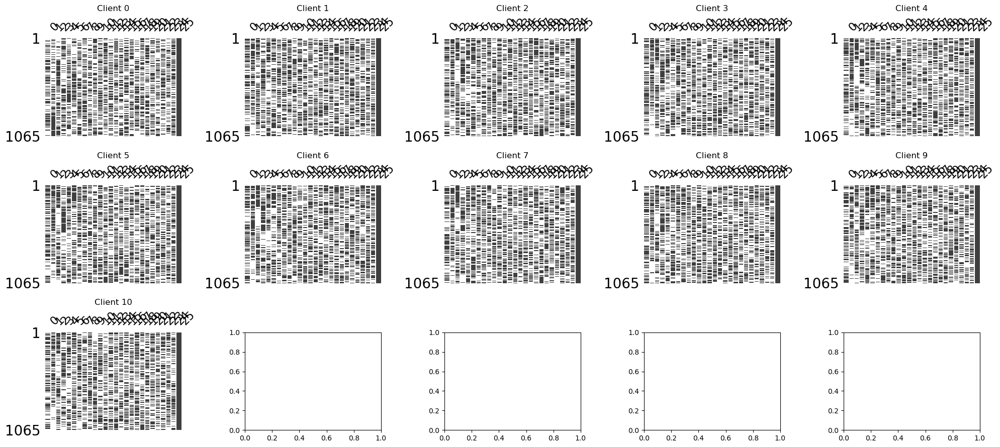

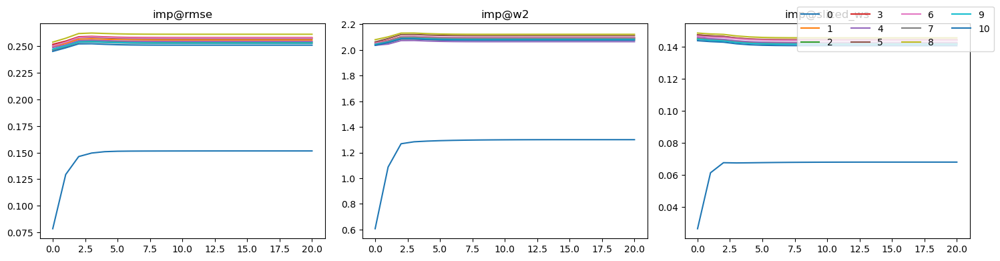

{'imp@rmse': 0.24613234782972357, 'imp@ws': 2.01805463508386, 'imp@sliced_ws': 0.13616762138704153}


2023-08-02 08:33:20.021 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 0, test_accu: 0.2183, test_f1: 0.0806 test_auroc: 0.7852 train_loss: 2.0358 val_accu: 0.2207 val_f1: 0.0404
2023-08-02 08:33:46.392 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 100, test_accu: 0.6826, test_f1: 0.6465 test_auroc: 0.9507 train_loss: 1.2545 val_accu: 0.5625 val_f1: 0.3224
2023-08-02 08:34:12.541 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 200, test_accu: 0.6879, test_f1: 0.6621 test_auroc: 0.9545 train_loss: 1.1059 val_accu: 0.5971 val_f1: 0.3668
2023-08-02 08:34:37.638 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 300, test_accu: 0.6749, test_f1: 0.6480 test_auroc: 0.9501 train_loss: 1.0417 val_accu: 0.6214 val_f1: 0.3882
2023-08-02 08:35:03.689 | INFO     | src.fed_imp.sub_modules.server.pred_server_ce

0.7002305918524212 0.9573200588259659 0.6705442531540108


In [15]:
name = 'mnar_lr_codon_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codon'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(13008, 26)
(11707, 26) (1301, 26)
(11707, 26)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1301, 26)


2023-08-02 08:41:54.816 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:41:54.817 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-02 08:43:06.498 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:43:06.499 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-02 08:44:18.778 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:44:18.779 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-02 08:44:26.144 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 154.13708709995262


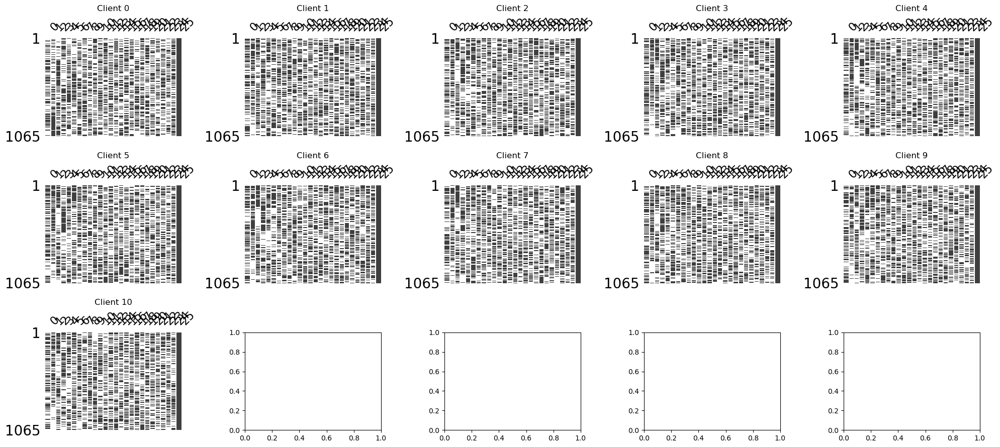

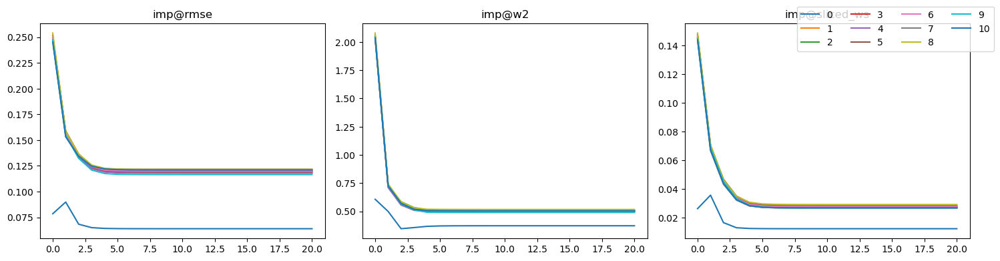

{'imp@rmse': 0.11453043431897561, 'imp@ws': 0.48896923900419104, 'imp@sliced_ws': 0.026248099440013356}


2023-08-02 08:44:29.890 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 0, test_accu: 0.3989, test_f1: 0.2708 test_auroc: 0.8347 train_loss: 2.0237 val_accu: 0.3824 val_f1: 0.1170
2023-08-02 08:44:55.494 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 100, test_accu: 0.8540, test_f1: 0.8440 test_auroc: 0.9889 train_loss: 0.4005 val_accu: 0.8451 val_f1: 0.6733
2023-08-02 08:45:21.018 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 200, test_accu: 0.8601, test_f1: 0.8507 test_auroc: 0.9899 train_loss: 0.3483 val_accu: 0.8592 val_f1: 0.7112
2023-08-02 08:45:47.358 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 300, test_accu: 0.8640, test_f1: 0.8559 test_auroc: 0.9901 train_loss: 0.3257 val_accu: 0.8609 val_f1: 0.7059
2023-08-02 08:46:13.161 | INFO     | src.fed_imp.sub_modules.server.pred_server_ce

0.8731744811683321 0.9904368089900297 0.8678631432986038


In [16]:
name = 'mnar_lr_codon_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codon'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

# Diabetic

## MNAR LR Balanced

(101766, 50)
(69569, 43)
(12304, 40)
(11073, 40) (1231, 40)
(11073, 40)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1231, 40)


2023-08-13 15:54:00.938 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:54:00.938 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 15:55:02.832 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:55:02.833 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 15:56:06.091 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:56:06.091 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 15:56:12.461 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 133.00582120000036


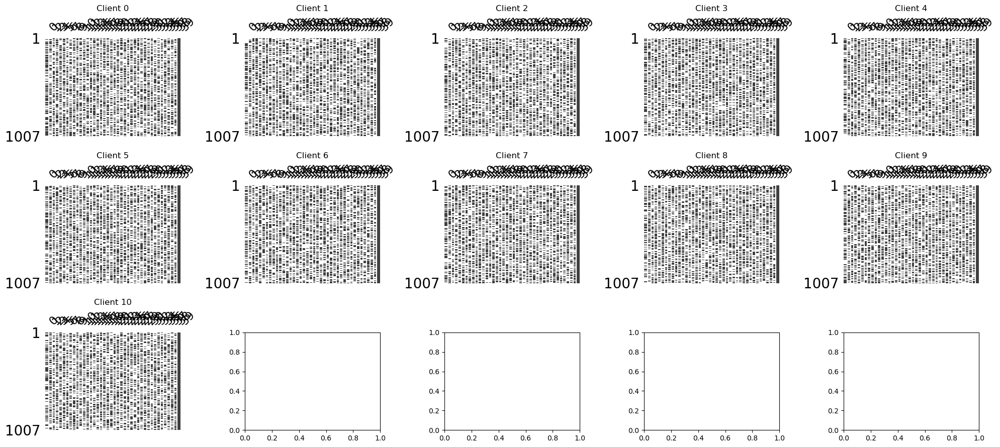

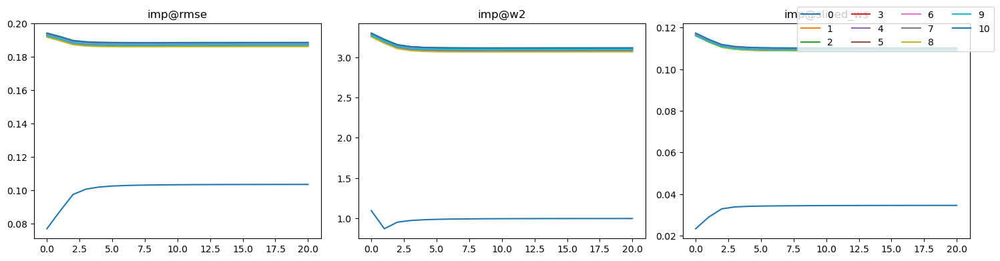

{'imp@rmse': 0.1798108449703412, 'imp@ws': 2.907739919209964, 'imp@sliced_ws': 0.10270709437035162}


In [38]:
name = 'mnar_lr_diabetic_balanced_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic_balanced'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [108]:
pred_ret = NN_evaluation(
    rets['mnar_lr_diabetic_balanced_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl
)

2023-08-15 13:54:03.613 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.5061, test_f1: 0.6176 test_auroc: 0.5329 train_loss: 0.6937 val_accu: 0.5216 val_f1: 0.4254 test recall 0.7984 precision 0.5036 b-accu 0.5063
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-08-15 13:54:03.855 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.4996, test_f1: 0.6663 test_auroc: 0.5375 train_loss: 0.6932 val_accu: 0.5000 val_f1: 0.3333 test recall 1.0000 precision 0.4996 b-accu 0.5000
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set

KeyboardInterrupt: 

(101766, 50)
(69569, 43)
(12304, 40)
(11073, 40) (1231, 40)
(11073, 40)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1231, 40)


2023-08-13 16:00:36.490 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:00:36.490 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 16:01:46.102 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:01:46.103 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 16:03:03.058 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:03:03.060 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 16:03:11.272 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 156.3069531999936


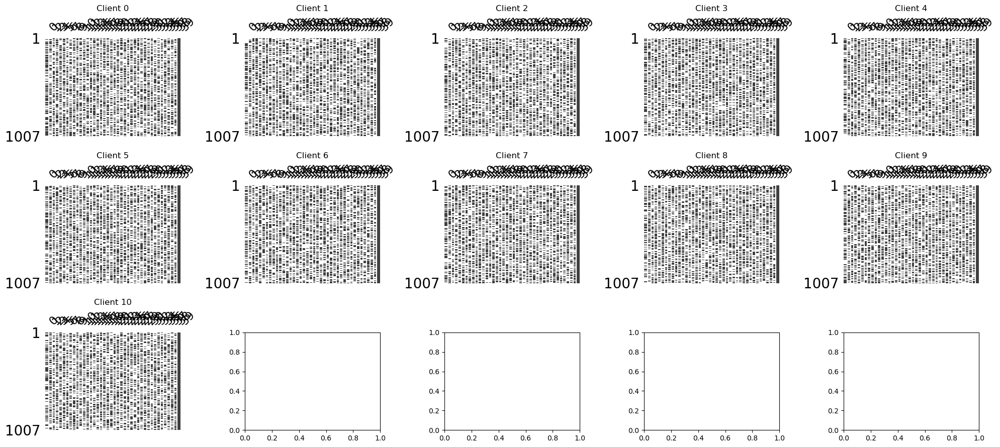

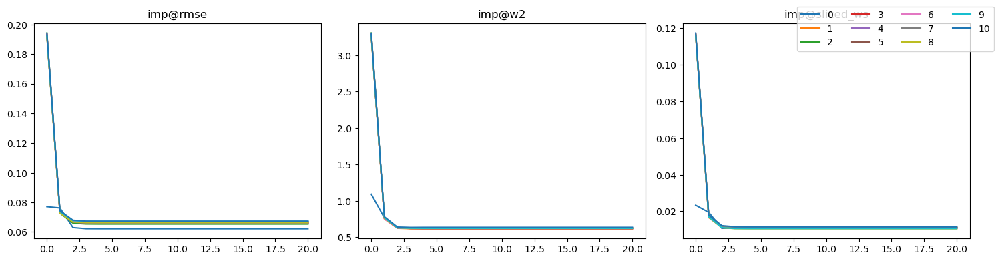

{'imp@rmse': 0.0660972440324338, 'imp@ws': 0.6247642796126843, 'imp@sliced_ws': 0.010921442720041577}


In [50]:
name = 'mnar_lr_diabetic_balanced_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic_balanced'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [51]:
pred_ret = NN_evaluation(
    rets['mnar_lr_diabetic_balanced_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance
)

2023-08-13 16:03:13.710 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.4996, test_f1: 0.6663 test_auroc: 0.5795 train_loss: 0.6925 val_accu: 0.5000 val_f1: 0.3333 test recall 1.0000 precision 0.4996 b-accu 0.5000
2023-08-13 16:03:19.205 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.5711, test_f1: 0.6030 test_auroc: 0.6041 train_loss: 0.6751 val_accu: 0.5747 val_f1: 0.5676 test recall 0.6520 precision 0.5608 b-accu 0.5711
2023-08-13 16:03:24.706 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.5776, test_f1: 0.6012 test_auroc: 0.6065 train_loss: 0.6673 val_accu: 0.5783 val_f1: 0.5743 test recall 0.6374 precision 0.5689 b-accu 0.5776
2023-08-13 16:03:30.102 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.5548, test_f1: 0.3701 tes

0.5848903330625508 0.6169095132509768 0.6663055254604551


## MNAR RL Balanced

(101766, 50)
(69569, 43)
(12304, 40)
(11073, 40) (1231, 40)
(11073, 40)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(1231, 40)


2023-08-13 16:04:13.642 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:04:13.643 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 16:05:19.234 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:05:19.234 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 16:06:31.842 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:06:31.842 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 16:06:39.177 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 147.09446360000584


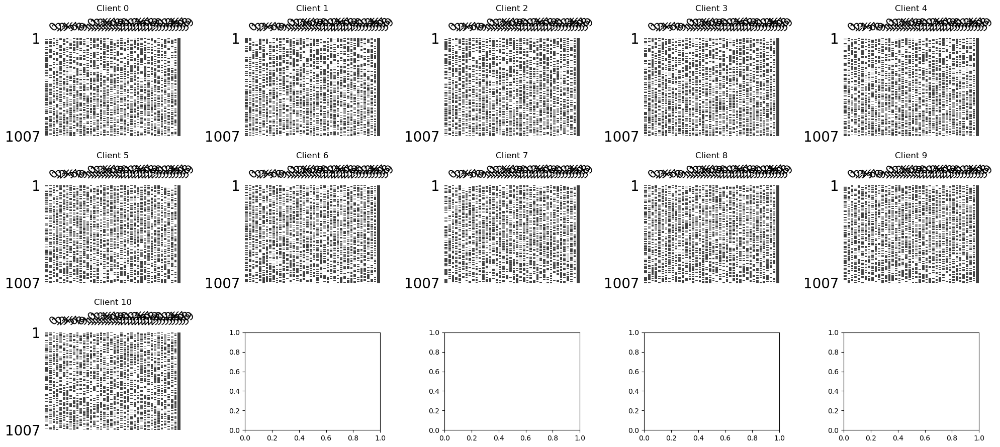

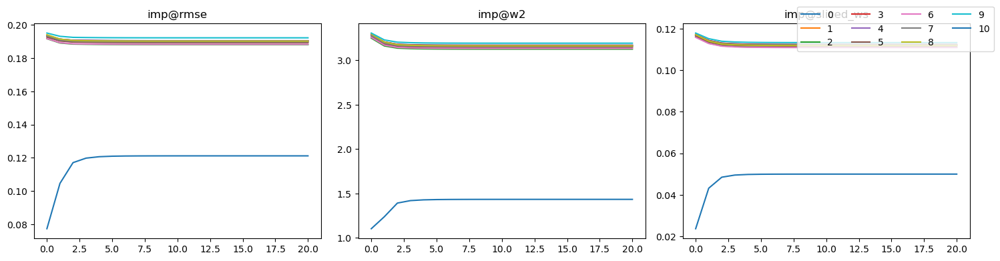

{'imp@rmse': 0.1834628636199087, 'imp@ws': 3.0015080453480363, 'imp@sliced_ws': 0.10623595106028708}


In [52]:
name = 'mnar_rl_diabetic_balanced_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic_balanced'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [53]:
pred_ret = NN_evaluation(
    rets['mnar_rl_diabetic_balanced_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl
)

2023-08-13 16:06:41.427 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.4996, test_f1: 0.6663 test_auroc: 0.5661 train_loss: 0.6934 val_accu: 0.5000 val_f1: 0.3333 test recall 1.0000 precision 0.4996 b-accu 0.5000
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-def

0.5637692932575142 0.5938034526449161 0.6673924877517692


(101766, 50)
(69569, 43)
(12304, 40)
(11073, 40) (1231, 40)
(11073, 40)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(1231, 40)


2023-08-13 16:07:20.885 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:07:20.885 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 16:08:31.678 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:08:31.679 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 16:09:49.601 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:09:49.603 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 16:09:57.723 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 158.37089079999714


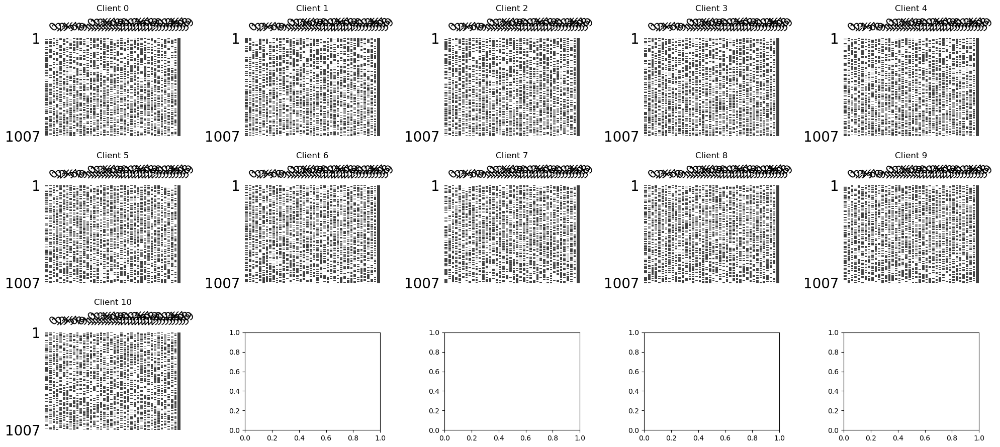

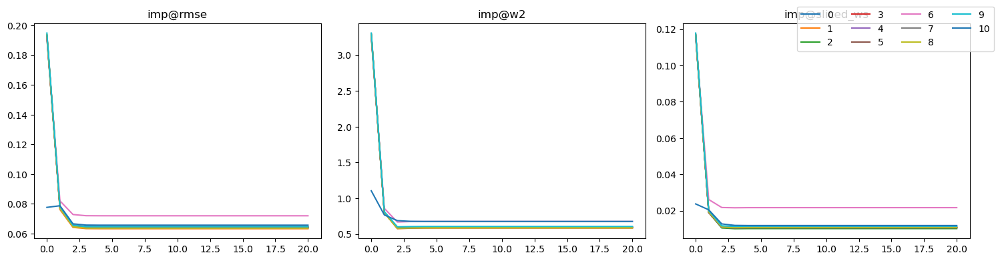

{'imp@rmse': 0.06481581530446393, 'imp@ws': 0.6070274632977812, 'imp@sliced_ws': 0.0118153631317388}


In [54]:
name = 'mnar_rl_diabetic_balanced_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic_balanced'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [55]:
pred_ret = NN_evaluation(
    rets['mnar_rl_diabetic_balanced_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl
)

2023-08-13 16:10:00.125 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.4996, test_f1: 0.6663 test_auroc: 0.5897 train_loss: 0.6927 val_accu: 0.5000 val_f1: 0.3333 test recall 1.0000 precision 0.4996 b-accu 0.5000
2023-08-13 16:10:05.944 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.5686, test_f1: 0.6070 test_auroc: 0.6033 train_loss: 0.6722 val_accu: 0.5792 val_f1: 0.5761 test recall 0.6667 precision 0.5571 b-accu 0.5687
2023-08-13 16:10:11.662 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.5768, test_f1: 0.6138 test_auroc: 0.6077 train_loss: 0.6622 val_accu: 0.5918 val_f1: 0.5875 test recall 0.6732 precision 0.5640 b-accu 0.5768
2023-08-13 16:10:17.377 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.5800, test_f1: 0.5279 tes

0.5913891145410236 0.6145813536057438 0.6670281995661604


## MNAR LR Raw

(101766, 50)
(99492, 43)
X_cat: (99492, 27)
(20000, 36)
(18000, 36) (2000, 36)
(18000, 36)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 36)


2023-08-15 15:27:51.995 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:27:51.996 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-15 15:29:19.364 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:29:19.365 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-15 15:30:51.437 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:30:51.437 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-15 15:31:00.775 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 191.75341539998772


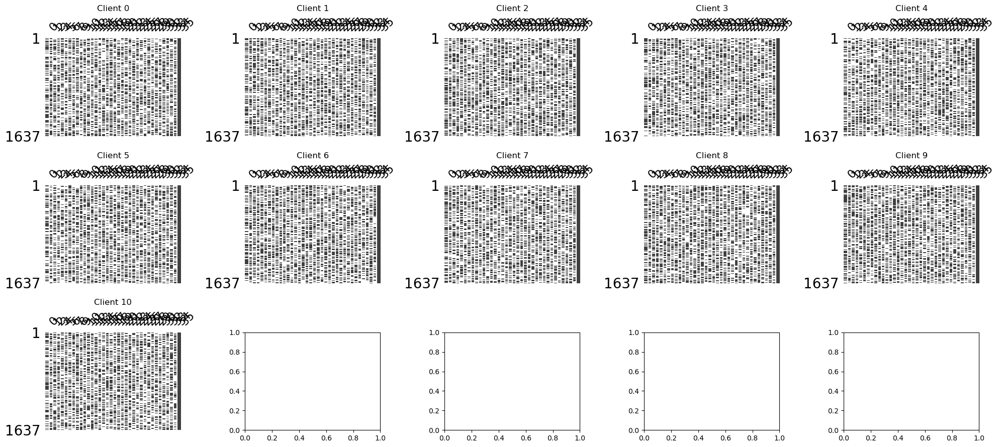

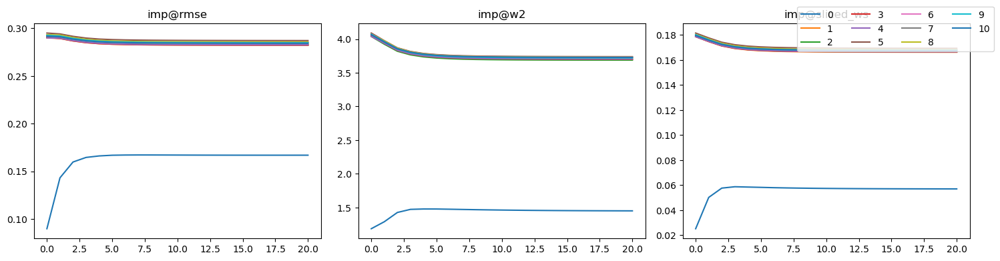

{'imp@rmse': 0.27342276583758485, 'imp@ws': 3.511075269963826, 'imp@sliced_ws': 0.15745070285530816}


In [50]:
name = 'mnar_lr_diabetic_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [78]:
pred_ret = NN_evaluation(
    rets['mnar_lr_diabetic_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = 'rus'
)

2023-08-15 15:43:36.503 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.2265, test_f1: 0.2175 test_auroc: 0.5932 train_loss: 0.6932 val_accu: 0.5098 val_f1: 0.4855 test recall 0.9556 precision 0.1227 b-accu 0.5448


2023-08-15 15:43:36.605 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.3755, test_f1: 0.2266 test_auroc: 0.6080 train_loss: 0.6926 val_accu: 0.5147 val_f1: 0.4865 test recall 0.8133 precision 0.1317 b-accu 0.5667
2023-08-15 15:43:36.697 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 4, test_accu: 0.2685, test_f1: 0.2206 test_auroc: 0.6192 train_loss: 0.6920 val_accu: 0.5393 val_f1: 0.5293 test recall 0.9200 precision 0.1253 b-accu 0.5530
2023-08-15 15:43:36.771 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 6, test_accu: 0.4985, test_f1: 0.2314 test_auroc: 0.6164 train_loss: 0.6913 val_accu: 0.5098 val_f1: 0.4235 test recall 0.6711 precision 0.1398 b-accu 0.5739
2023-08-15 15:43:36.850 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 8, test_accu: 0.3835, test_f1: 0.2240 test_aur

0.6885 0.6200212832550861 0.24657534246575344


(101766, 50)
(99492, 43)
X_cat: (99492, 27)
(20000, 36)
(18000, 36) (2000, 36)
(18000, 36)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 36)


2023-08-15 15:31:15.821 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:31:15.822 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-15 15:32:56.531 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:32:56.532 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-15 15:34:50.112 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:34:50.113 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-15 15:35:01.807 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 228.99875180001254


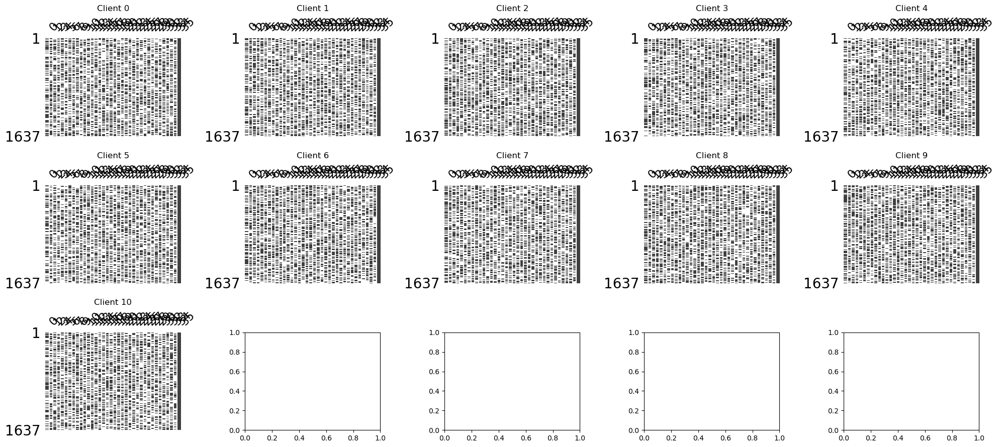

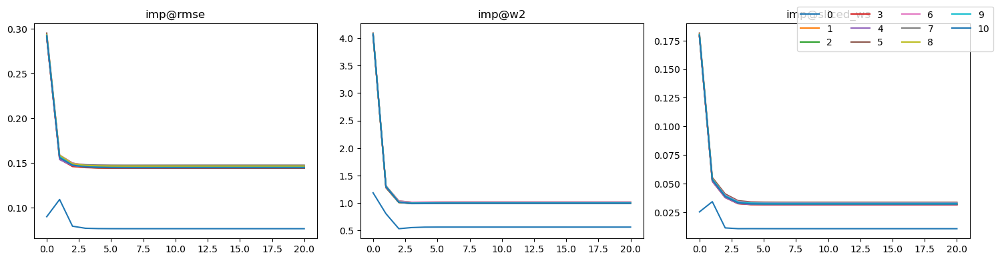

{'imp@rmse': 0.1390576853480248, 'imp@ws': 0.963563440726219, 'imp@sliced_ws': 0.030118899469288963}


In [51]:
name = 'mnar_lr_diabetic_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [79]:
pred_ret = NN_evaluation(
    rets['mnar_lr_diabetic_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = 'rus'
)

2023-08-15 15:43:57.819 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.4845, test_f1: 0.2335 test_auroc: 0.6040 train_loss: 0.6922 val_accu: 0.5627 val_f1: 0.5584 test recall 0.6978 precision 0.1402 b-accu 0.5776
2023-08-15 15:43:57.912 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.5075, test_f1: 0.2299 test_auroc: 0.6147 train_loss: 0.6897 val_accu: 0.5688 val_f1: 0.5653 test recall 0.6533 precision 0.1395 b-accu 0.5712
2023-08-15 15:43:58.018 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 4, test_accu: 0.5670, test_f1: 0.2377 test_auroc: 0.6152 train_loss: 0.6869 val_accu: 0.5651 val_f1: 0.5650 test recall 0.6000 precision 0.1482 b-accu 0.5814
2023-08-15 15:43:58.117 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 6, test_accu: 0.6450, test_f1: 0.2398 test_aur

0.6815 0.6223824726134585 0.260593220338983


## MNAR RL RAW

(101766, 50)
(99492, 43)
X_cat: (99492, 27)
(20000, 36)
(18000, 36) (2000, 36)
(18000, 36)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 36)


2023-08-15 15:44:30.783 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:44:30.783 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-15 15:46:10.504 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:46:10.504 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-15 15:48:16.137 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:48:16.138 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-15 15:48:29.026 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 241.44171289997757


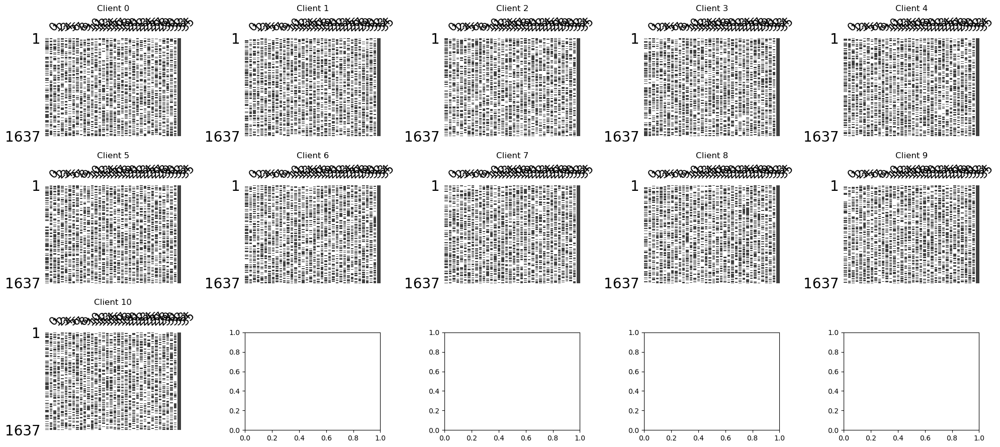

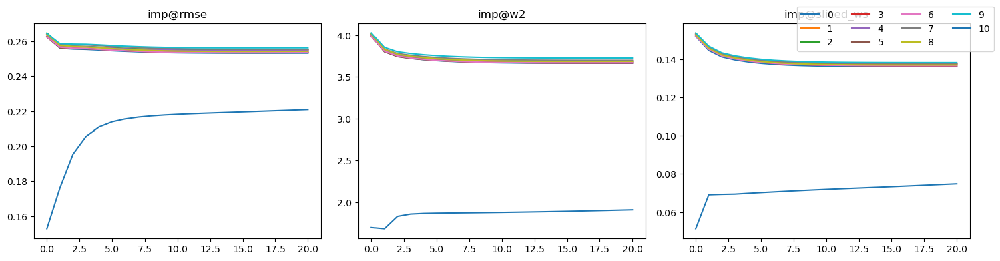

{'imp@rmse': 0.25140655448522464, 'imp@ws': 3.5236075605412593, 'imp@sliced_ws': 0.1314985732263445}


In [80]:
name = 'mnar_rl_diabetic_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [96]:
pred_ret = NN_evaluation(
    rets['mnar_rl_diabetic_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = 'rus'
)

2023-08-15 15:59:47.486 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.5145, test_f1: 0.2226 test_auroc: 0.5708 train_loss: 0.6924 val_accu: 0.5799 val_f1: 0.5779 test recall 0.6178 precision 0.1357 b-accu 0.5596


2023-08-15 15:59:47.528 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 1, test_accu: 0.6330, test_f1: 0.2354 test_auroc: 0.5798 train_loss: 0.6859 val_accu: 0.6007 val_f1: 0.5990 test recall 0.5022 precision 0.1537 b-accu 0.5759
2023-08-15 15:59:47.591 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.6205, test_f1: 0.2356 test_auroc: 0.5852 train_loss: 0.6811 val_accu: 0.5971 val_f1: 0.5967 test recall 0.5200 precision 0.1523 b-accu 0.5766
2023-08-15 15:59:47.643 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 3, test_accu: 0.6155, test_f1: 0.2394 test_auroc: 0.5889 train_loss: 0.6795 val_accu: 0.5946 val_f1: 0.5946 test recall 0.5378 precision 0.1539 b-accu 0.5816
2023-08-15 15:59:47.689 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 4, test_accu: 0.6205, test_f1: 0.2372 test_aur

0.7255 0.5969877934272301 0.24897400820793433


(101766, 50)
(99492, 43)
X_cat: (99492, 27)
(20000, 36)
(18000, 36) (2000, 36)
(18000, 36)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 36)


2023-08-15 15:48:57.413 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:48:57.414 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-15 15:50:46.208 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:50:46.209 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-15 15:52:39.152 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:52:39.153 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-15 15:52:50.451 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 236.3528633999813


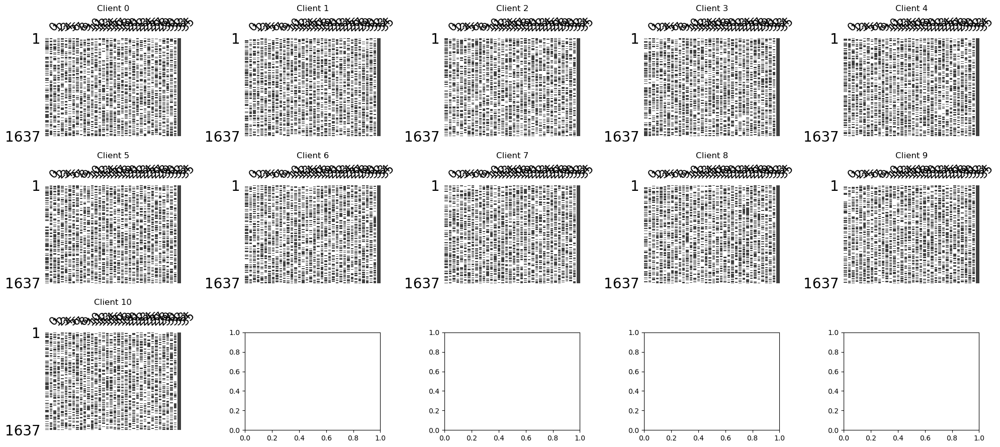

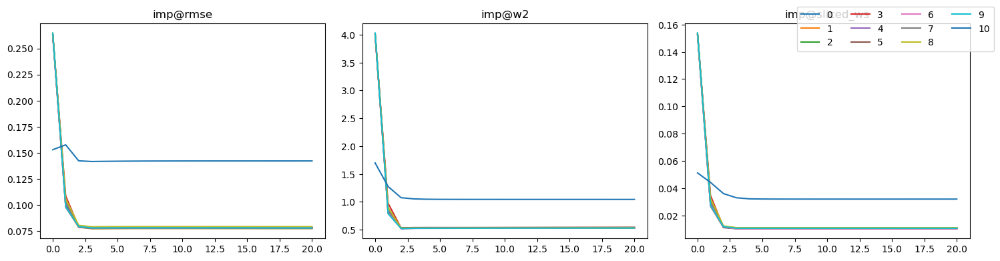

{'imp@rmse': 0.08367851250199473, 'imp@ws': 0.5799366546005541, 'imp@sliced_ws': 0.012645792566062247}


In [82]:
name = 'mnar_rl_diabetic_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [97]:
pred_ret = NN_evaluation(
    rets['mnar_rl_diabetic_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = 'rus'
)

2023-08-15 16:00:23.133 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.6015, test_f1: 0.2402 test_auroc: 0.5888 train_loss: 0.6920 val_accu: 0.6044 val_f1: 0.6042 test recall 0.5600 precision 0.1529 b-accu 0.5834
2023-08-15 16:00:23.181 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 1, test_accu: 0.6080, test_f1: 0.2403 test_auroc: 0.6001 train_loss: 0.6831 val_accu: 0.6167 val_f1: 0.6162 test recall 0.5511 precision 0.1537 b-accu 0.5832
2023-08-15 16:00:23.225 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.6100, test_f1: 0.2412 test_auroc: 0.6051 train_loss: 0.6753 val_accu: 0.6204 val_f1: 0.6198 test recall 0.5511 precision 0.1544 b-accu 0.5843
2023-08-15 16:00:23.277 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 3, test_accu: 0.6055, test_f1: 0.2406 test_aur

0.735 0.6126372456964007 0.2572614107883818


# Cardio

In [42]:
trackers = {}
rets ={}
mr_strategy = 'fixed@mr=0.5'

['gender', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'NEW_AGE', 'NEW_BMI', 'BLOOD_PRESSURE']
(70000, 20)
(70000, 12)
(20000, 12)
11
1.0    10011
0.0     9989
Name: count, dtype: int64
(18000, 12) (2000, 12)
(18000, 12)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 12)


2023-08-03 19:15:07.582 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:15:07.583 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-03 19:16:29.130 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:16:29.131 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-03 19:17:38.890 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:17:38.891 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-03 19:17:46.507 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 163.48836580000352


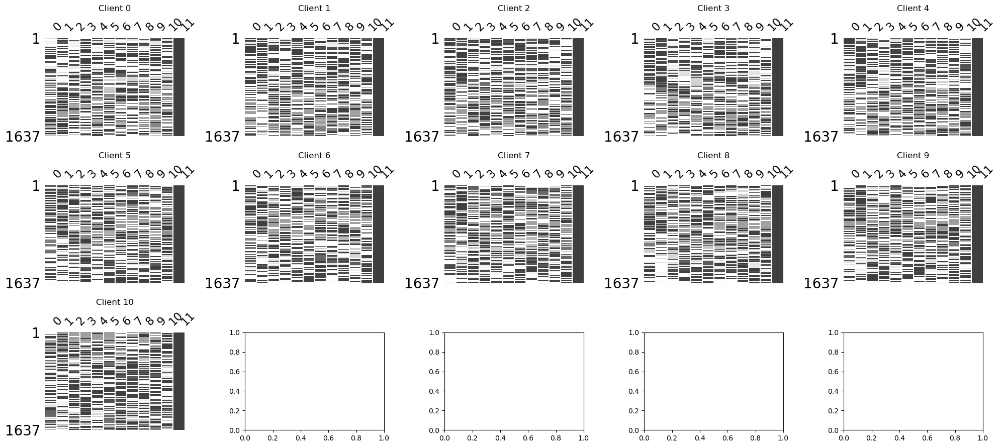

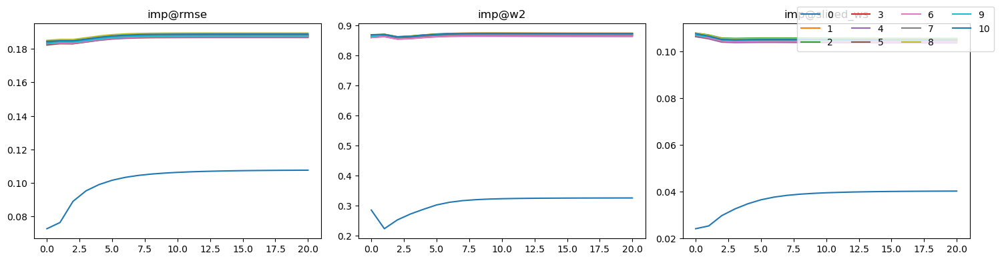

{'imp@rmse': 0.1805928921916503, 'imp@ws': 0.8211636117179579, 'imp@sliced_ws': 0.09885332860512797}


In [45]:
name = 'mnar_lr_cardio_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'cardio'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [46]:
pred_ret = NN_evaluation(
    rets['mnar_lr_cardio_fedavg-s'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)


2023-08-03 19:17:49.559 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 0, test_accu: 0.5410, test_f1: 0.4339 test_auroc: 0.6688 train_loss: 0.6940 val_accu: 0.5017 val_f1: 0.3380
2023-08-03 19:17:57.442 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 20, test_accu: 0.4995, test_f1: 0.3331 test_auroc: 0.5020 train_loss: 0.6933 val_accu: 0.5000 val_f1: 0.3333
2023-08-03 19:18:05.596 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 40, test_accu: 0.5005, test_f1: 0.3336 test_auroc: 0.5020 train_loss: 0.6936 val_accu: 0.5000 val_f1: 0.3333
2023-08-03 19:18:13.301 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 60, test_accu: 0.4995, test_f1: 0.3331 test_auroc: 0.5020 train_loss: 0.6932 val_accu: 0.5000 val_f1: 0.3333
2023-08-03 19:18:20.776 | INFO     | src.fed_imp.sub_modules.server.pred_server_centr

0.5835 0.6825971825971826 0.5403162767494678


['gender', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'NEW_AGE', 'NEW_BMI', 'BLOOD_PRESSURE']
(70000, 20)
(70000, 12)
(20000, 12)
11
1.0    10011
0.0     9989
Name: count, dtype: int64
(18000, 12) (2000, 12)
(18000, 12)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 12)


2023-08-03 19:21:07.852 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:21:07.853 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-03 19:22:13.165 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:22:13.165 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-03 19:23:27.163 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:23:27.163 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-03 19:23:34.960 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 151.88568760000635


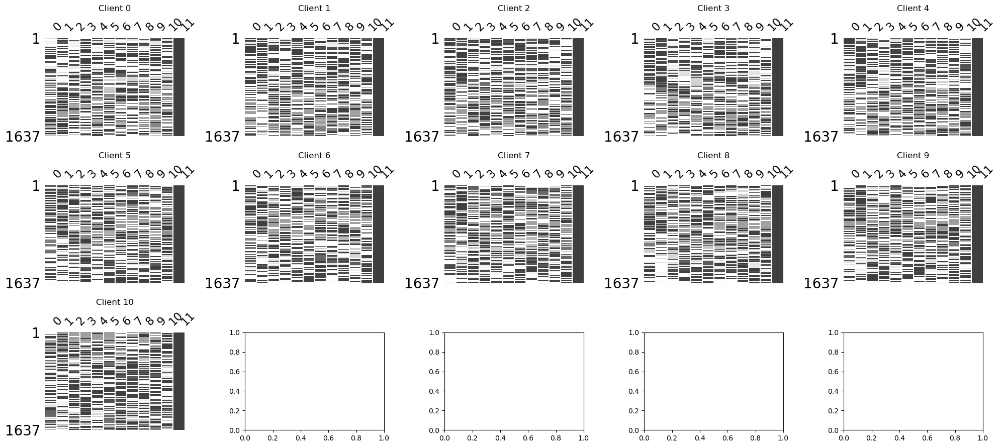

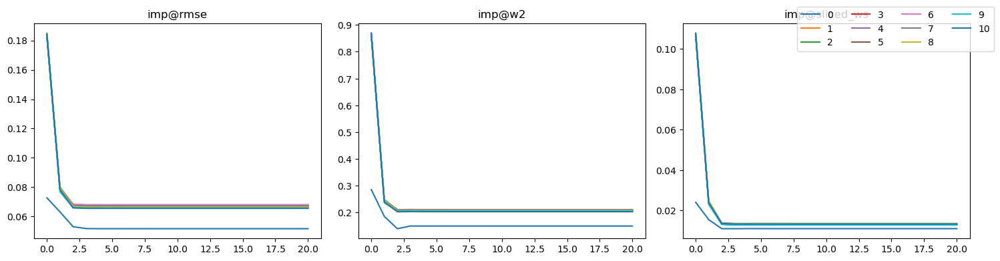

{'imp@rmse': 0.06543817506394098, 'imp@ws': 0.20229980583053633, 'imp@sliced_ws': 0.013060052115186857}


In [47]:
name = 'mnar_lr_cardio_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'cardio'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [48]:
pred_ret = NN_evaluation(
    rets['mnar_lr_cardio_fedmechw'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)


2023-08-03 19:23:38.051 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 0, test_accu: 0.6680, test_f1: 0.6674 test_auroc: 0.7506 train_loss: 0.6565 val_accu: 0.6912 val_f1: 0.6911
2023-08-03 19:23:45.786 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 20, test_accu: 0.7190, test_f1: 0.7170 test_auroc: 0.7877 train_loss: 0.5774 val_accu: 0.7273 val_f1: 0.7266
2023-08-03 19:23:53.256 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 40, test_accu: 0.7160, test_f1: 0.7139 test_auroc: 0.7878 train_loss: 0.5737 val_accu: 0.7195 val_f1: 0.7179
2023-08-03 19:24:00.885 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 60, test_accu: 0.7100, test_f1: 0.7069 test_auroc: 0.7873 train_loss: 0.5709 val_accu: 0.7201 val_f1: 0.7193
2023-08-03 19:24:08.911 | INFO     | src.fed_imp.sub_modules.server.pred_server_centr

0.7265 0.7922517922517921 0.7264999316249829


['gender', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'NEW_AGE', 'NEW_BMI', 'BLOOD_PRESSURE']
(70000, 20)
(70000, 12)
(20000, 12)
11
1.0    10011
0.0     9989
Name: count, dtype: int64
(18000, 12) (2000, 12)
(18000, 12)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 12)


2023-08-03 19:27:17.562 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:27:17.563 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-03 19:28:24.723 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:28:24.723 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-03 19:29:33.111 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:29:33.112 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-03 19:29:40.181 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 147.21332359994994


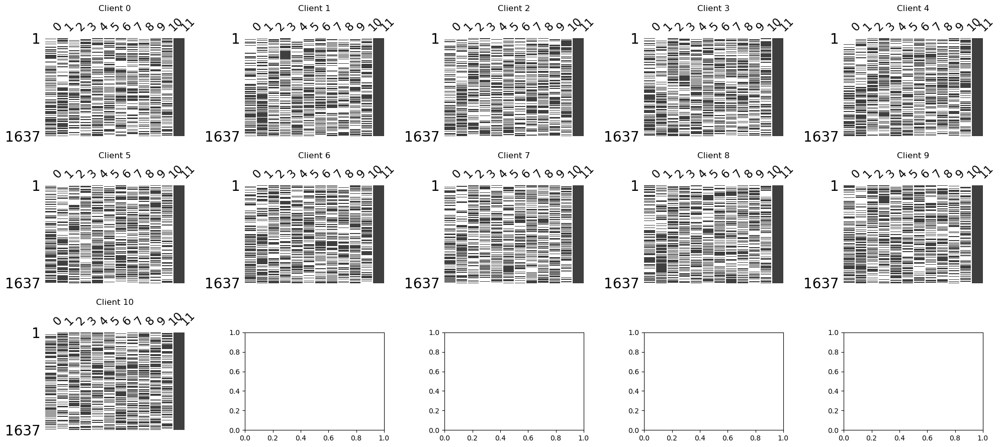

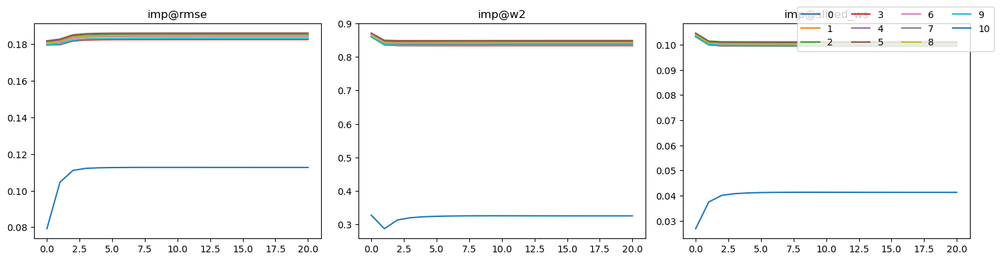

{'imp@rmse': 0.17795875628492033, 'imp@ws': 0.7944499369117158, 'imp@sliced_ws': 0.0949492538761867}


In [49]:
name = 'mnar_rl_cardio_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'cardio'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [50]:
pred_ret = NN_evaluation(
    rets['mnar_rl_cardio_fedavg-s'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)


2023-08-03 19:29:42.958 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 0, test_accu: 0.5970, test_f1: 0.5701 test_auroc: 0.6067 train_loss: 0.6906 val_accu: 0.6247 val_f1: 0.6176
2023-08-03 19:29:50.591 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 20, test_accu: 0.6730, test_f1: 0.6728 test_auroc: 0.7311 train_loss: 0.6363 val_accu: 0.6610 val_f1: 0.6571
2023-08-03 19:29:57.859 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 40, test_accu: 0.6820, test_f1: 0.6820 test_auroc: 0.7392 train_loss: 0.6270 val_accu: 0.6655 val_f1: 0.6607
2023-08-03 19:30:05.200 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 60, test_accu: 0.6800, test_f1: 0.6799 test_auroc: 0.7245 train_loss: 0.6230 val_accu: 0.6727 val_f1: 0.6693
2023-08-03 19:30:12.549 | INFO     | src.fed_imp.sub_modules.server.pred_server_centr

0.688 0.745974245974246 0.6879472630874618


['gender', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'NEW_AGE', 'NEW_BMI', 'BLOOD_PRESSURE']
(70000, 20)
(70000, 12)
(20000, 12)
11
1.0    10011
0.0     9989
Name: count, dtype: int64
(18000, 12) (2000, 12)
(18000, 12)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 12)


2023-08-03 19:32:56.555 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:32:56.555 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-03 19:33:59.802 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:33:59.803 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-03 19:35:14.830 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:35:14.831 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-03 19:35:22.460 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 150.49200660001952


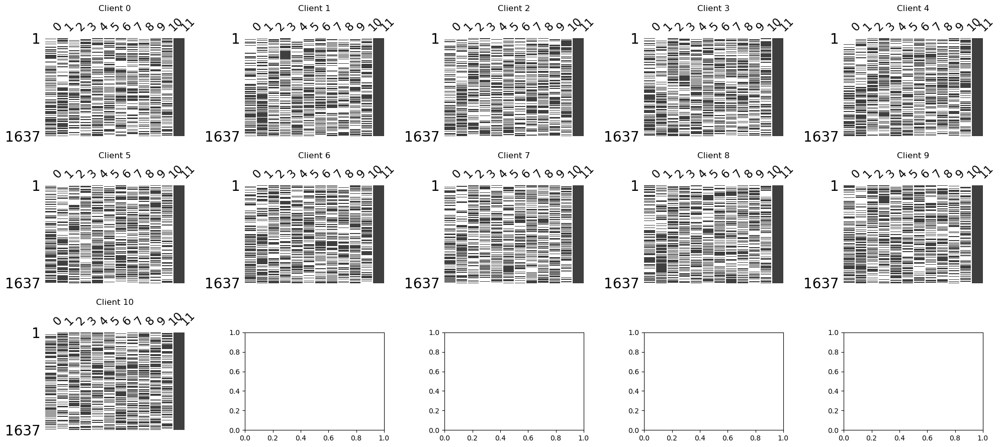

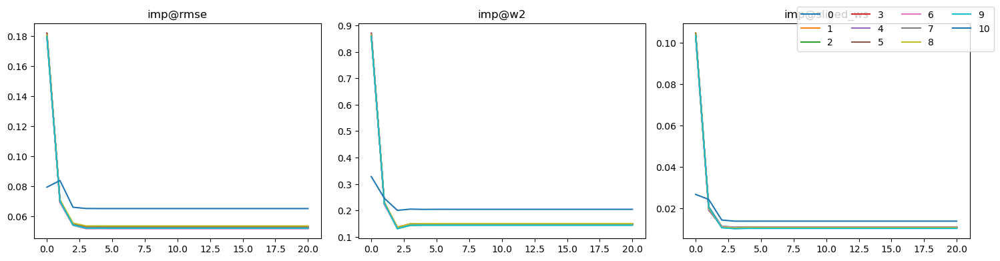

{'imp@rmse': 0.053483969634496406, 'imp@ws': 0.15272740569858834, 'imp@sliced_ws': 0.011088363895667294}


In [51]:
name = 'mnar_rl_cardio_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'cardio'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [52]:
pred_ret = NN_evaluation(
    rets['mnar_rl_cardio_fedmechw'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)


2023-08-03 19:35:25.497 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 0, test_accu: 0.6895, test_f1: 0.6881 test_auroc: 0.7636 train_loss: 0.6305 val_accu: 0.7043 val_f1: 0.7042
2023-08-03 19:35:32.399 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 20, test_accu: 0.7160, test_f1: 0.7147 test_auroc: 0.7826 train_loss: 0.5654 val_accu: 0.7226 val_f1: 0.7201
2023-08-03 19:35:40.070 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 40, test_accu: 0.7130, test_f1: 0.7106 test_auroc: 0.7831 train_loss: 0.5600 val_accu: 0.7201 val_f1: 0.7161
2023-08-03 19:35:48.517 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 60, test_accu: 0.7170, test_f1: 0.7144 test_auroc: 0.7876 train_loss: 0.5635 val_accu: 0.7192 val_f1: 0.7151


# MIMIC III MORTALITY

(20000, 51)
mortality
0    14556
1     5444
Name: count, dtype: int64
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-08-17 00:47:31.743 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-17 00:47:31.744 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1


KeyboardInterrupt: 

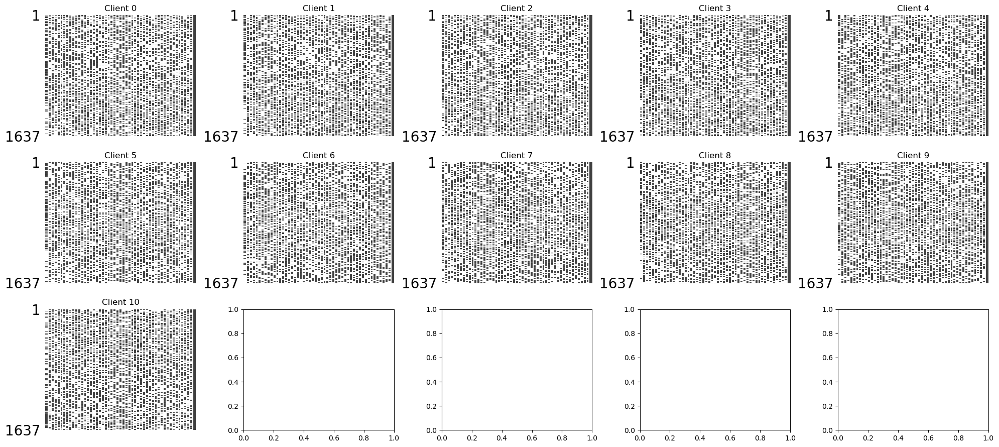

In [63]:
name = 'mnar_rl_mimicmo_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_mo2'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

(20000, 41)
ICD9_GROUP
5     7991
7     2449
1     2082
4     1308
2     1126
0     1022
3      891
8      847
11     719
9      702
6      451
10     412
Name: count, dtype: int64
(18000, 41) (2000, 41)
(18000, 41)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 41)


2023-08-17 00:47:48.844 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-17 00:47:48.844 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1


KeyboardInterrupt: 

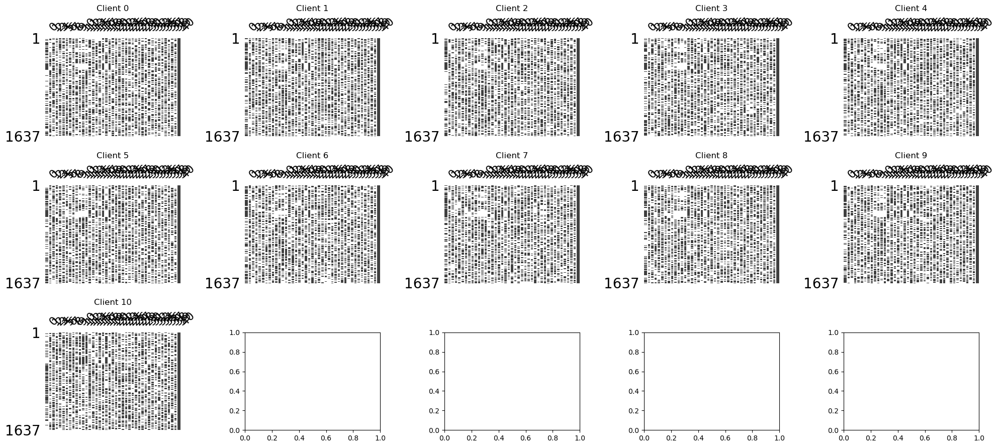

In [64]:
name = 'mnar_rl_mimicmo_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_icd'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [61]:
pred_ret = NN_evaluation(
    rets['mnar_rl_mimicmo_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

ValueError: multiclass format is not supported

(4156450, 19)
(58976, 22)
(46491, 18)
(46491, 96)
(38857, 41)
(38857, 61)
(20000, 61)
mortality
0    14142
1     5858
Name: count, dtype: int64
(18000, 61) (2000, 61)
(18000, 61)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 61)


2023-08-16 09:34:29.123 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:34:29.124 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:37:22.275 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:37:22.275 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:40:36.103 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:40:36.103 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 09:40:54.470 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 387.95476370002143


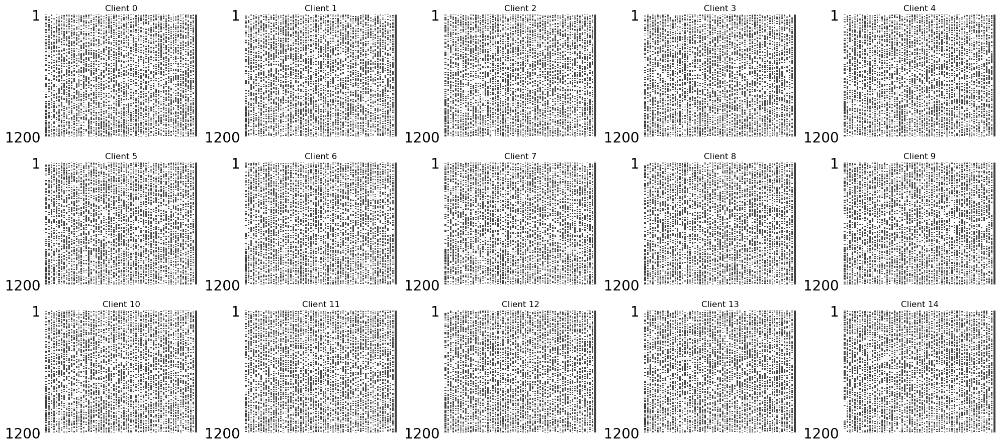

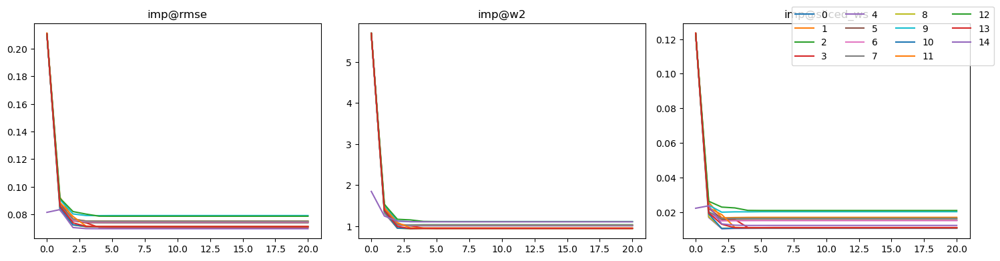

{'imp@rmse': 0.07341203876768884, 'imp@ws': 1.009889162306651, 'imp@sliced_ws': 0.014199697993315595}


In [117]:
name = 'mnar_rl_mimicmo_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_mo'
config2['handle_imbalance'] = None
config2['num_clients'] = 15
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [118]:
pred_ret = NN_evaluation(
    rets['mnar_rl_mimicmo_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-08-16 09:40:55.643 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.7070, test_f1: 0.0000 test_auroc: 0.8284 train_loss: 0.6032 val_accu: 0.7083 val_f1: 0.4146 test recall 0.0000 precision 0.0000 b-accu 0.5000
2023-08-16 09:40:55.778 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 1, test_accu: 0.7745, test_f1: 0.3762 test_auroc: 0.8754 train_loss: 0.5263 val_accu: 0.7711 val_f1: 0.6100 test recall 0.2321 precision 0.9927 b-accu 0.6157
2023-08-16 09:40:55.906 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.8380, test_f

0.858 0.9047928805557299 0.7269372693726937


# MIMICIII LOS

(20000, 51)
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-08-20 19:54:38.254 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 19:54:38.255 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-20 19:57:33.172 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 19:57:33.172 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-20 20:00:47.720 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 20:00:47.721 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-20 20:01:01.971 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 386.39866740000434


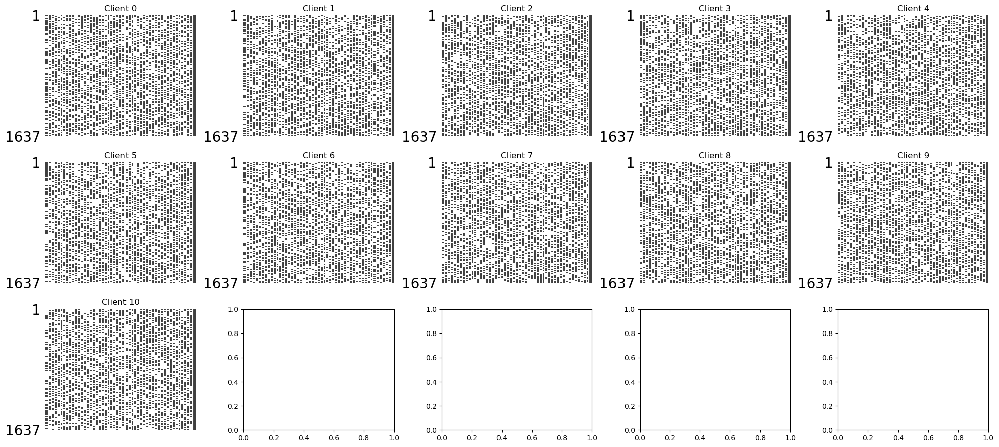

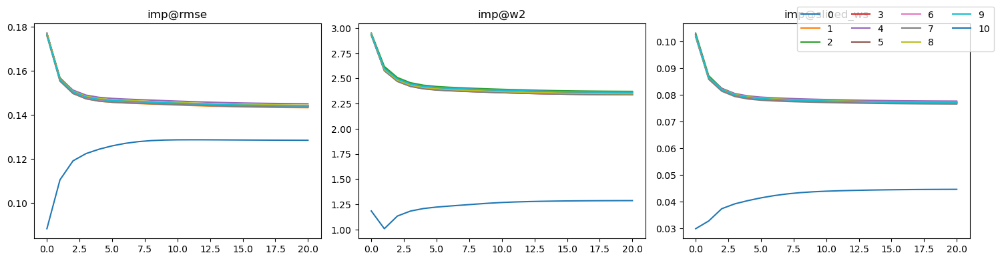

{'imp@rmse': 0.14269867194717897, 'imp@ws': 2.2563689936082825, 'imp@sliced_ws': 0.07414163390828002}


In [6]:
name = 'mnar_rl_mimiclos_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_los'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

(20000, 51)
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-08-20 20:01:32.508 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 20:01:32.509 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-20 20:03:44.886 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 20:03:44.887 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-20 20:06:06.307 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 20:06:06.307 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-20 20:06:20.189 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 290.579703800031


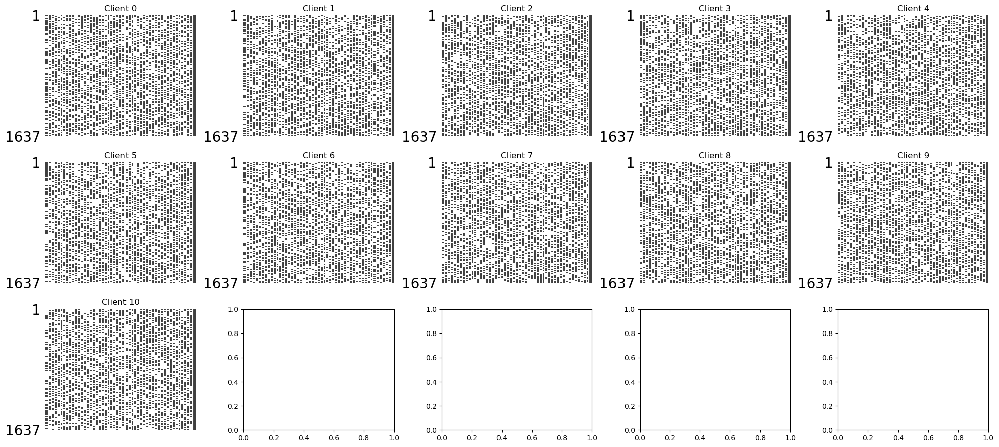

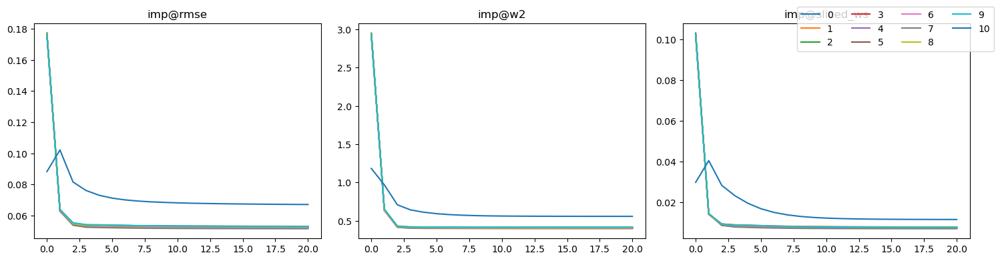

{'imp@rmse': 0.05380920966955938, 'imp@ws': 0.42096792122636717, 'imp@sliced_ws': 0.007984998409465961}


In [7]:
name = 'mnar_rl_mimiclos_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_los'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

# Genetic

Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-08-16 09:48:55.589 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:48:55.590 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:50:10.815 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:50:10.815 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:51:28.889 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:51:28.889 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 09:51:36.726 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 163.8380214999779


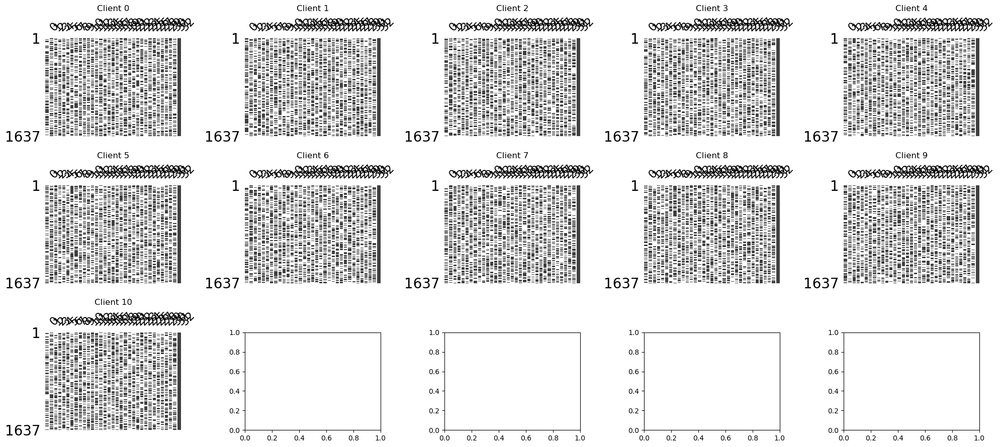

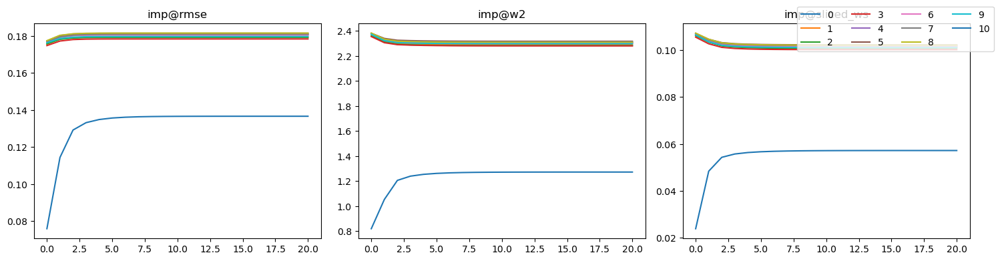

{'imp@rmse': 0.17629010620295868, 'imp@ws': 2.2071112336612475, 'imp@sliced_ws': 0.09742176082373848}


In [6]:
name = 'mnar_rl_genetic_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [54]:
pred_ret = NN_evaluation(
    rets['mnar_rl_genetic_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

2023-08-16 17:05:36.891 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.4993 test_auprc: 0.2515 train_loss: 0.5755 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:05:37.046 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 1, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5315 test_auprc: 0.2692 train_loss: 0.5617 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:05:37.187 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 2, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5568 test_auprc: 0.2860 train_loss: 0.5615 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:05:37.332 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 3, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5842 test_auprc: 0.3067 train_loss: 0.5607 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 1

0.753 0.2566137566137566 0.653776573800499 0.3788621721596042


Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-08-16 09:51:45.166 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:51:45.166 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:52:57.852 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:52:57.853 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:54:19.223 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:54:19.224 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 09:54:27.353 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 164.76211860001786


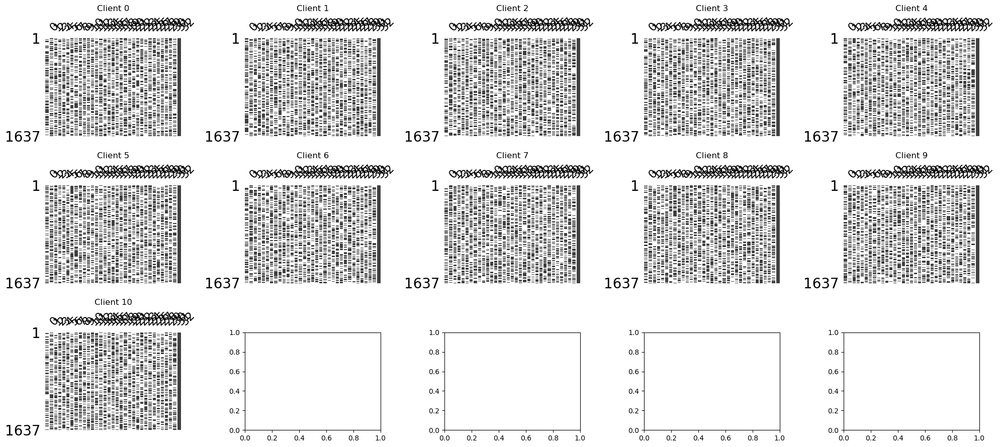

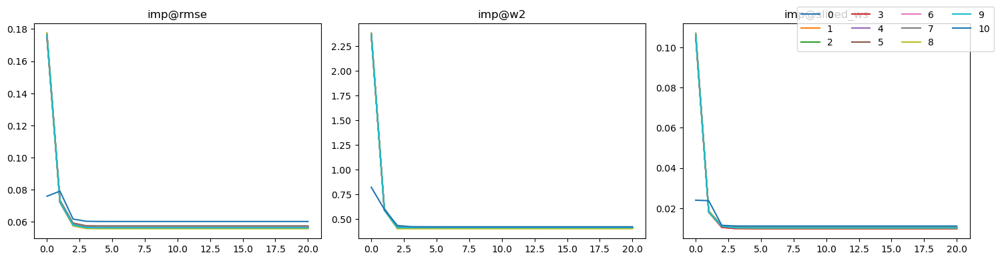

{'imp@rmse': 0.05683915396535701, 'imp@ws': 0.41200755567497166, 'imp@sliced_ws': 0.010124558245875855}


In [7]:
name = 'mnar_rl_genetic_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [55]:
pred_ret = NN_evaluation(
    rets['mnar_rl_genetic_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

2023-08-16 17:06:12.556 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5426 test_auprc: 0.2762 train_loss: 0.5757 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:12.670 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 1, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6116 test_auprc: 0.3255 train_loss: 0.5588 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:12.779 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 2, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6446 test_auprc: 0.3574 train_loss: 0.5533 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:12.888 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 3, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6529 test_auprc: 0.3651 train_loss: 0.5445 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 1

0.7555 0.39679715302491103 0.6701317358234123 0.3816156290790693


Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-08-16 09:54:35.991 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:54:35.991 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:55:41.313 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:55:41.314 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:56:57.006 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:56:57.007 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 09:57:04.776 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 151.45910480001476


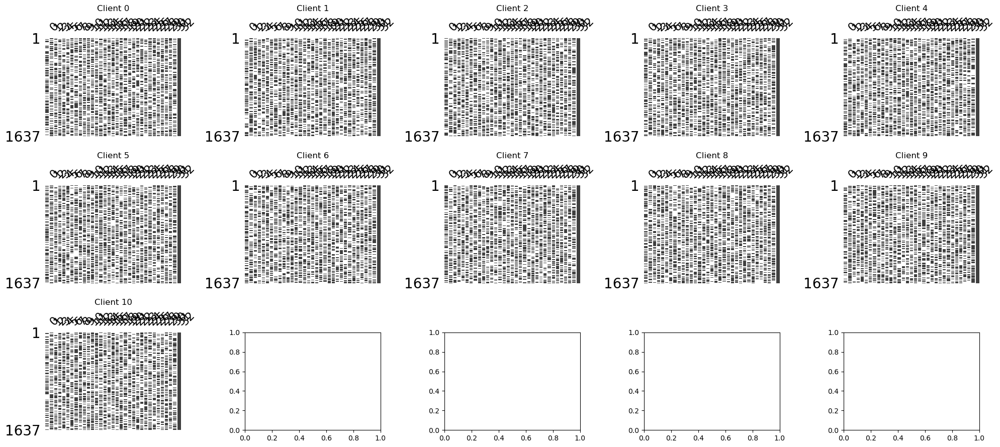

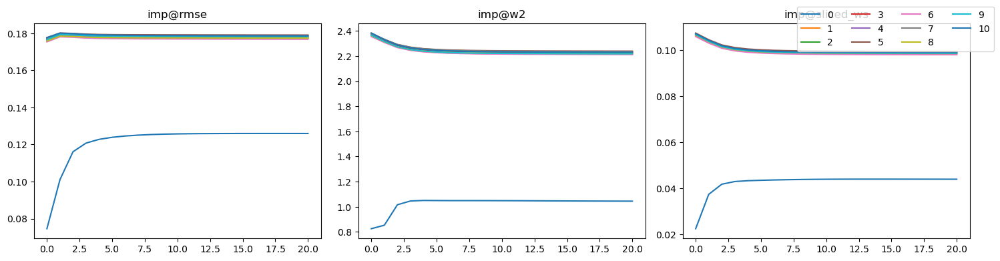

{'imp@rmse': 0.17323219195260878, 'imp@ws': 2.1175038781347433, 'imp@sliced_ws': 0.09374673964282788}


In [8]:
name = 'mnar_lr_genetic_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [56]:
pred_ret = NN_evaluation(
    rets['mnar_lr_genetic_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

2023-08-16 17:06:47.231 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.4892 test_auprc: 0.2391 train_loss: 0.5778 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:47.345 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 1, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5242 test_auprc: 0.2599 train_loss: 0.5628 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:47.456 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 2, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5491 test_auprc: 0.2783 train_loss: 0.5619 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:47.566 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 3, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5635 test_auprc: 0.2899 train_loss: 0.5605 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 1

0.7525 0.31739572736520855 0.630966129460787 0.34453231830756986


Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-08-16 09:57:13.601 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:57:13.601 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:58:30.076 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:58:30.076 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:59:56.533 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:59:56.533 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 10:00:05.356 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 174.45900879998226


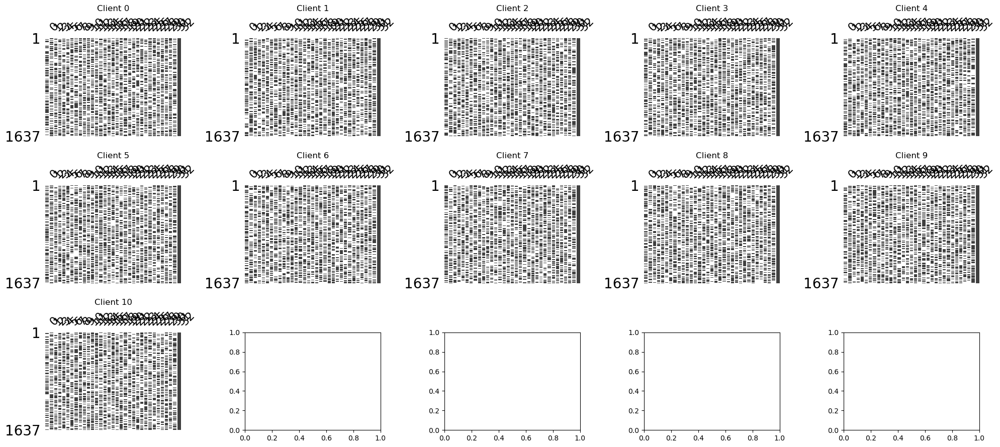

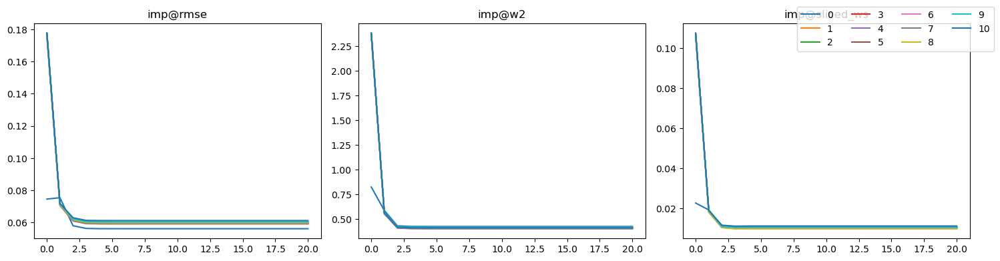

{'imp@rmse': 0.059586867172133684, 'imp@ws': 0.4136522421771314, 'imp@sliced_ws': 0.010196954033889441}


In [9]:
name = 'mnar_lr_genetic_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [57]:
pred_ret = NN_evaluation(
    rets['mnar_lr_genetic_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

2023-08-16 17:07:21.984 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5515 test_auprc: 0.2790 train_loss: 0.5760 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:07:22.091 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 1, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6231 test_auprc: 0.3327 train_loss: 0.5587 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:07:22.340 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 2, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6458 test_auprc: 0.3563 train_loss: 0.5530 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:07:22.456 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 3, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6523 test_auprc: 0.3665 train_loss: 0.5444 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 1

0.7545 0.39065108514190316 0.6818500425234213 0.3927096190113667
